In [5]:
from utils import *
from plot import plot_enrich
from gprofiler import GProfiler

/bgfs/alee/chelsea/apps/anaconda3/envs/py37/lib/python3.7/site-packages/dask/config.py:161: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  data = yaml.load(f.read()) or {}


In [6]:
!ls ../data/scVelo 

AL1.h5ad	   CellAdataDict.pkl		  Server.3000g.h5ad
AL1_ref_norm.h5ad  CellCycleAdataDict.pkl
AL1_ref_raw.h5ad   CycleGene_PearsonCorrDict.pkl


In [ ]:
CellDict = pickle.load(open("../data/CNV/Cell_CNV_AdataDict.pkl","rb"))
CellTypes = ['MCF7', 'T47D WT', 'T47D KO', 'MM134', 'SUM44', 'BCK4', 'MCF10A', 'HEK293']

# MCF7 subpopulation
- Reference
    - https://journals.plos.org/plosone/article?id=10.1371/journal.pone.0137782
    - [NMFEM the paper whose code I used](https://www.ncbi.nlm.nih.gov/pmc/articles/PMC5251935/)
    - [Its github](https://github.com/lanagarmire/NMFEM)
    
- NMFEM function `/bgfs/alee/chelsea/projects/10X/packages/NMFEM/R/nmf_subpopulation.R`
```R
    ren <- nmf(rwl, rank=n_subpop_, nrun=nrun_, method=method_, .options=.options_, seed=seed_)
    output$nmf_result <- ren
      
    if (verbose_level_ >= 1) message('* Calculating D-scores ...')
    weighting_factors <- basis(ren)['artificial',]
    
    d_score_calc <- function(x) {
      names(x) <- paste0('basis_',1:length(x))
      weighted_x <- x/weighting_factors # weighting_factors is the H components of the `const. expressing gene`
      names(weighted_x) <- paste0(names(x), '_weighted')
      basis_sorted <- sort(range(weighted_x), decreasing=T) # return (max, min) of the input vector
      d_score <- basis_sorted[1] - basis_sorted[2]
      which_max <- which.max(unname(weighted_x))
      c(x, weighted_x, d_score=d_score, which_max=which_max)
    }
```

## NMF

In [3]:
from calcNMF import calcNMF 

101 genes selected in NMF


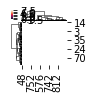

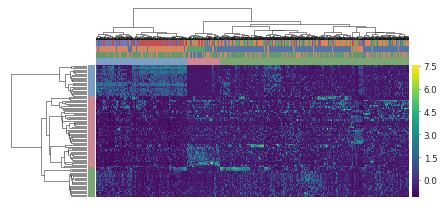

In [7]:
# Params
cell = 'MCF7'
n_genes=50
kmin=5
kmax=15
overlap_thres=0.6
db='REAC'
depth=2
    
# NMF with different k
tmp = CellDict[cell]
sc.tl.louvain(tmp, resolution=0.4)

E = tmp.X.toarray()
Er = E - np.mean(E, axis=0)    
Er = np.clip(Er, a_min=0, a_max=None) # looks better after clipping

df = calcNMF(E, n_genes=n_genes, kmin=kmin, kmax=kmax)
dim = df.shape[0]
overlaps = np.zeros((dim, dim))

for i in range(dim):
    for j in range(dim):
        if i==j:
            ovl=0
        else:
            ovl = len(set(df[i,:]) & set(df[j,:]))/n_genes
        overlaps[i,j] = ovl

# overlapping programs with different k
sel_idx = np.where(np.max(overlaps, axis=0) > overlap_thres)[0]
P = df[sel_idx,:]

# Heatmap with selected features (genes)
gidx = np.unique(P.flatten())
print(f'{len(gidx)} genes selected in NMF')
Genes = np.array(tmp.var.index)[gidx]

Y = Er[:,gidx].T # gene X cells, use clipped matrix

# col colors (comparing different clusters from different data modality)
phs = np.array(tmp.obs['phase'].dtype.categories)
clist_ph = sns.color_palette(palette='deep', desat=1)
col_colors = [clist_ph[np.where(phs==ph)[0][0]] for ph in tmp.obs['phase'].values]

lvs = np.array(tmp.obs['louvain'].dtype.categories)
clist_lv = sns.color_palette(palette='deep', desat=.8)
col_colors_2 = [clist_lv[np.where(lvs==lv)[0][0]] for lv in tmp.obs['louvain'].values]

CnvClusts = np.array(tmp.obs['CNV_cluster'].dtype.categories)
clist_cnv = sns.color_palette(palette='deep', desat=.6)
col_colors_3 = [clist_cnv[np.where(CnvClusts==cl)[0][0]] for cl in tmp.obs['CNV_cluster'].values]

## used zscore
g0 = sns.clustermap(zscore(Y, axis=0), figsize=(1,1), method='ward', metric='euclidean', mask=True)
                                 
# Get Linkage
ArmCtsHeatmap = g0

col_linkage = g0.dendrogram_col.linkage
labels = get_clade_labels(np.array(tmp.obs.index), col_linkage, depth=2)
NMFmapper = {}
for lb, cells in labels.items():
    for cell in cells:
        NMFmapper[cell] = lb         
tmp.obs['NMF_cluster'] = [NMFmapper[x] for x in tmp.obs.index]
tmp.obs['NMF_cluster'] = tmp.obs['NMF_cluster'].astype('category')

row_linkage = g0.dendrogram_row.linkage
labels = get_clade_labels(np.array(tmp.var.index)[gidx], row_linkage, depth=2)
NMFGenemapper = {}
for lb, genes in labels.items():
    for gene in genes:
        NMFGenemapper[gene] = lb         

Nmf_cell = np.array(tmp.obs['NMF_cluster'].dtype.categories)
Nmf_cell_colors = np.array(sns.husl_palette(len(Nmf_cell), s=.45))[[0,2,1]] # same color code for both NMF gene and cell
col_colors_4 = [Nmf_cell_colors[np.where(Nmf_cell==c)[0][0]] for c in tmp.obs['NMF_cluster'].values]

Nmf_gene = np.array(list(labels.keys()))
Nmf_gene_colors = sns.husl_palette(len(Nmf_gene), s=.45)
row_colors = [Nmf_gene_colors[np.where(Nmf_gene==NMFGenemapper[g])[0][0]] for g in Genes]

## 
sns.set(context='paper', style='white', palette='deep', font='sans-serif', font_scale=1, color_codes=True)
mpl.rc('ytick.major', size=.8)

g = sns.clustermap(zscore(Y, axis=0), figsize=(7.2, 3.5), method='ward', metric='euclidean', cmap='viridis',
                   col_colors=[col_colors, col_colors_2, col_colors_3, col_colors_4], row_colors=row_colors,
                   height_colors_ratio=0.15, width_colors_ratio=0.15*3.5*0.25/7.2)

xlabels = np.array(tmp.obs.index)[np.array(g.dendrogram_col.reordered_ind)]
g.ax_heatmap.set_xticks([])
g.ax_heatmap.set_xticklabels('')

g.ax_heatmap.set_yticks([])
g.ax_heatmap.set_yticklabels('')

cbar = g.cax
x0,y0,x1,y1 = np.array(g.ax_heatmap.get_position()).flatten()
cbar.set_position([x1+0.005, y0, 0.015, y1-y0])

In [11]:
g.savefig('../Figure/Fig3/NMFHeatmapMCF7.png', dpi=300)

In [8]:
tmp.write('../data/scVelo/MCF7.h5ad')

## Enrich Dotplots

In [12]:
row_linkage = g.dendrogram_row.linkage
labels = get_clade_labels(np.array(tmp.var.index)[gidx], row_linkage, depth=2)
print(['{}: {} genes'.format(k, len(val)) for k, val in labels.items()])

['197: 55 genes', '198: 22 genes', '192: 24 genes']


197 55 ##############
TMEM64
AC103770.1
NECAB1
TFF1
SPTSSB
IGFBP4
PREX1
AREG
NPY1R
APOA1
TUBA3D
GSTM3
LRRC75A
BNIP3
PGK1
IGFBP5
TFF3
XBP1
NUPR1
AGR3
APOD
CXCL14
AZGP1
SCGB1D2
SCGB2A2
BST2
AGR2
STC2
CD24
LGALS3
PLA2G16
HSD17B1
TMSB4X
SNCG
GNG11
MGP
SERPINA6
ID3
ID1
NEAT1
MALAT1
TXNIP
BAG1
CLU
ADIRF
UCP2
GSN
MXD4
RPS27L
DSCAM-AS1
DDIT4
GDF15
CDKN1A
FOS
WISP2
Plotting 197_55genes
20 terms with height figsize Bbox(x0=0.0, y0=0.0, x1=4.0, y1=8.0) box Bbox(x0=0.125, y0=0.125, x1=0.9, y1=0.88)
198 22 ##############
MT2A
MT1F
MT1X
PDAP1
HNRNPR
NOP14
SFPQ
HNRNPA2B1
HNRNPU
NCL
SYNCRIP
EIF3A
TMOD3
FUBP1
TRPM7
RTF2
PRPF4B
NORAD
DST
RPS6KB1
CHD1
NSD1
Plotting 198_22genes
20 terms with height figsize Bbox(x0=0.0, y0=0.0, x1=4.0, y1=8.0) box Bbox(x0=0.125, y0=0.125, x1=0.9, y1=0.88)
192 24 ##############
CDK1
TOP2A
UBE2C
PSRC1
FAM83D
KPNA2
CKS2
KIF23
NDC80
AURKB
SGO2
ASPM
GTSE1
CCNB1
PLK1
AURKA
MKI67
CEP55
CENPE
CENPF
HMMR
DEPDC1
KNSTRN
CCNA2
Plotting 192_24genes
20 terms with height figsize Bbox(x0=

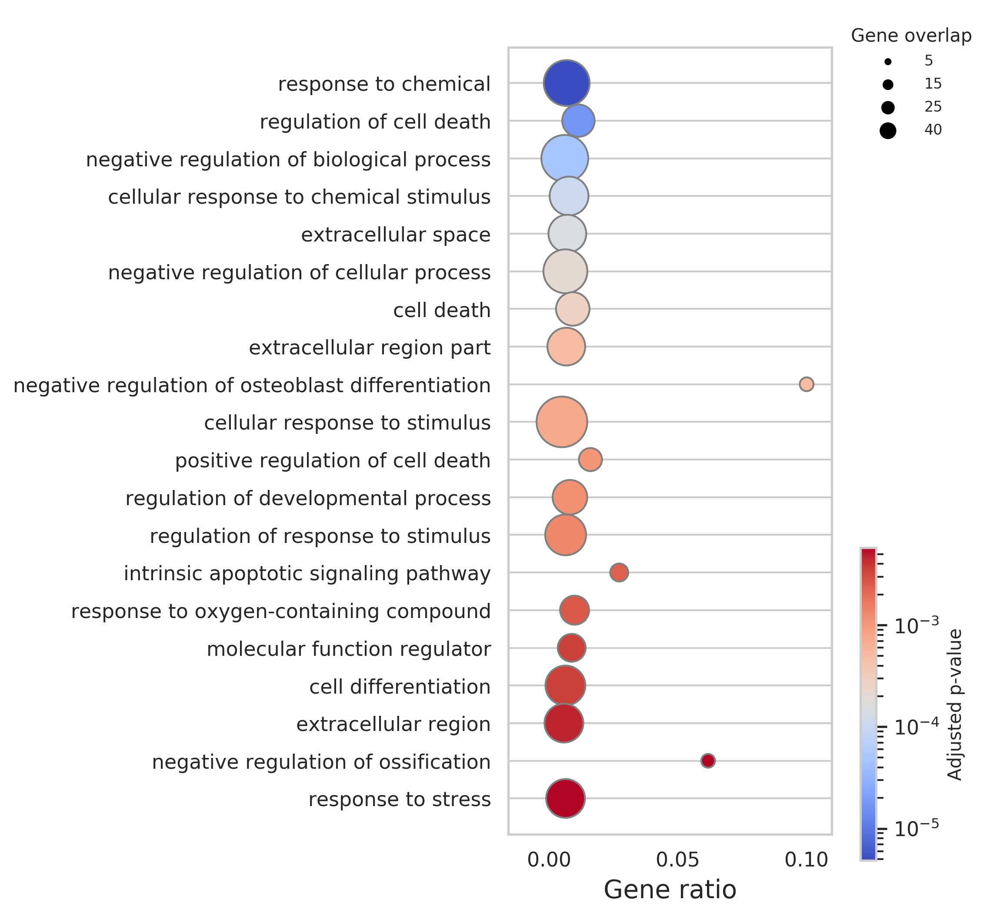

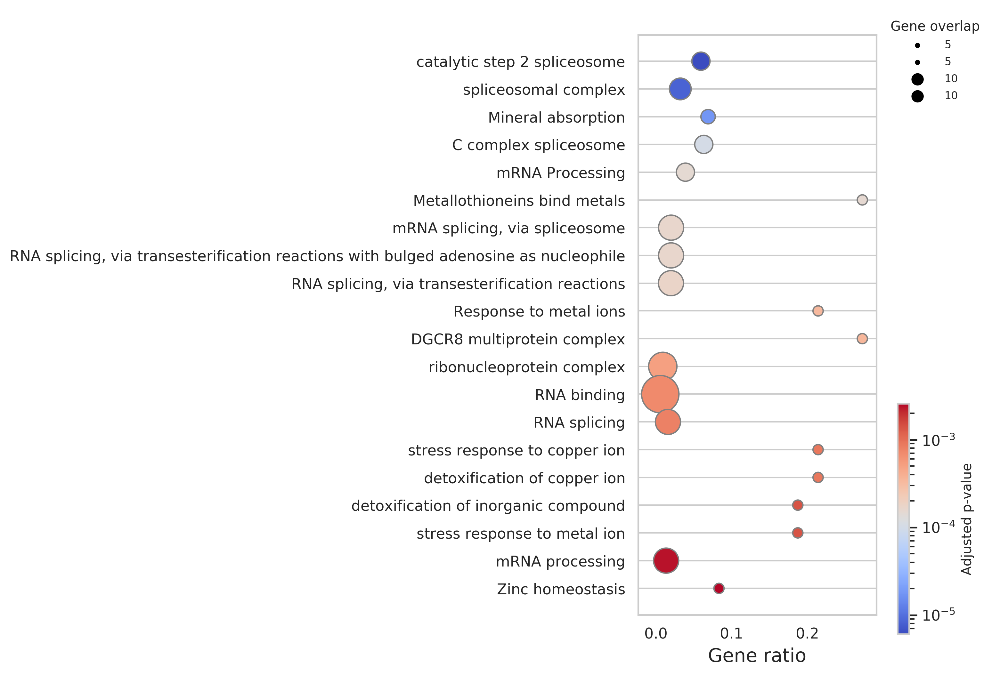

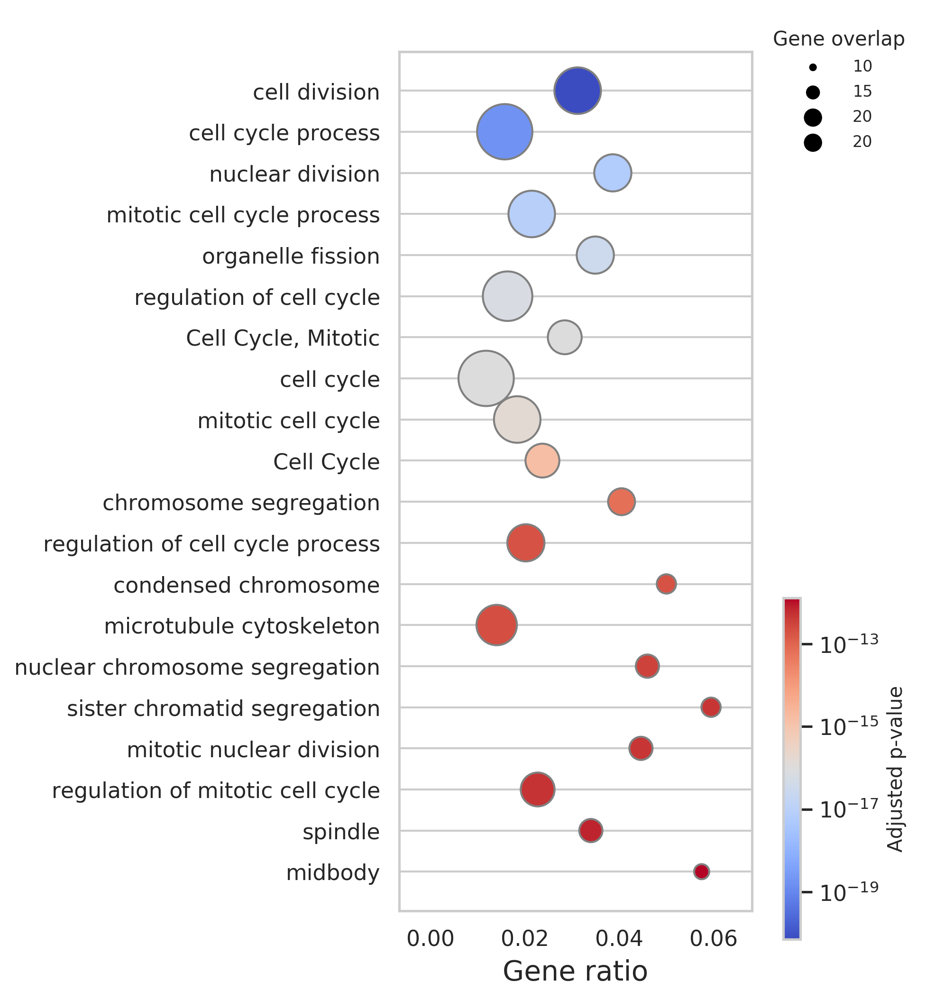

In [13]:
sns.set(context='paper', style='whitegrid', palette='deep', 
        font='sans-serif', font_scale=3, color_codes=True)

mpl.rc('figure', dpi=300, figsize=(4,8))

for lb, genes in labels.items():
    print(lb, len(genes), '##############')
    for g in genes:
        print(g)
    gp = GProfiler(return_dataframe=True)
    enr = gp.profile(organism='hsapiens',query=genes)
    print(f'Plotting {lb}_{len(genes)}genes')
    plot_enrich(enr, title='', save=f'../Figure/Fig3/NMFSigDot_{lb}_{len(genes)}genes.png', dpi=300)

In [28]:
for phase, genes in cycle_genes_whitefield_dict.items():
    print(phase,"\nAll genes",len(set(genes)),  '\nOverlap with MCF7 subpopulation:', len(set(genes) & set(labels[197])),'\n')

M/G1 
All genes 138 
Overlap with MCF7 subpopulation: 1 

*S phase 
All genes 7 
Overlap with MCF7 subpopulation: 0 

G2/M 
All genes 200 
Overlap with MCF7 subpopulation: 1 

G2 
All genes 164 
Overlap with MCF7 subpopulation: 0 

G1/S 
All genes 130 
Overlap with MCF7 subpopulation: 0 

S phase 
All genes 127 
Overlap with MCF7 subpopulation: 0 



In [29]:
!mkdir ../data/GSVA 

In [30]:
write_gmt({'ApopSig':labels[197]}, '../data/GSVA/ApopSig.gmt')

finished writing 1 gene sets to ../data/GSVA/ApopSig.gmt


## gProfiler => Cytoscape topology
- [gProfiler](https://biit.cs.ut.ee/gprofiler/gost)
    - run query
    - download: `Data sources`: `combined name.gmt`
    - download: `Detailed Results`: `GEM`
- Cytoscape: App `EnrichmentMap` -> open gProfiler dir
    - [EnrichmentMap Tutorial](https://enrichmentmap.readthedocs.io/en/latest/Network.html#node-visual-properties)

## Genesets overlap

In [9]:
mpl.style.use('NaturePub')
mpl.rc('figure', dpi=300)

In [68]:
keywords = ['PaSwneUp','PaSwneDown','CellCycle','ApopSig','h.all.v6.2.symbols'] # ApopSig == MCF7_EndUp gene list
gDict = {}
for kw in keywords:
    tmp = read_gmt(f'../data/GSVA/{kw}.gmt')
    for k, val in tmp.items():
        gDict[k] = val


In [69]:
gDict.keys()

dict_keys(['paswneup', 'paswnedown', 'cellcycle', 'apopsig', 'hallmark_tnfa_signaling_via_nfkb', 'hallmark_hypoxia', 'hallmark_cholesterol_homeostasis', 'hallmark_mitotic_spindle', 'hallmark_wnt_beta_catenin_signaling', 'hallmark_tgf_beta_signaling', 'hallmark_il6_jak_stat3_signaling', 'hallmark_dna_repair', 'hallmark_g2m_checkpoint', 'hallmark_apoptosis', 'hallmark_notch_signaling', 'hallmark_adipogenesis', 'hallmark_estrogen_response_early', 'hallmark_estrogen_response_late', 'hallmark_androgen_response', 'hallmark_myogenesis', 'hallmark_protein_secretion', 'hallmark_interferon_alpha_response', 'hallmark_interferon_gamma_response', 'hallmark_apical_junction', 'hallmark_apical_surface', 'hallmark_hedgehog_signaling', 'hallmark_complement', 'hallmark_unfolded_protein_response', 'hallmark_pi3k_akt_mtor_signaling', 'hallmark_mtorc1_signaling', 'hallmark_e2f_targets', 'hallmark_myc_targets_v1', 'hallmark_myc_targets_v2', 'hallmark_epithelial_mesenchymal_transition', 'hallmark_inflammatory

In [76]:
from pyvenn import venn
testDict = {k:gDict[k] for k in ['paswneup','paswnedown','cellcycle','apopsig']}
labels = venn.get_labels([v for v in testDict.values()] , fill=['number', 'logic'])
labels

{'0001': '0001: 33',
 '0010': '0010: 7',
 '0011': '0011: 0',
 '0100': '0100: 1140',
 '0101': '0101: 9',
 '0110': '0110: 93',
 '0111': '0111: 0',
 '1000': '1000: 299',
 '1001': '1001: 13',
 '1010': '1010: 0',
 '1011': '1011: 0',
 '1100': '1100: 0',
 '1101': '1101: 0',
 '1110': '1110: 0',
 '1111': '1111: 0'}

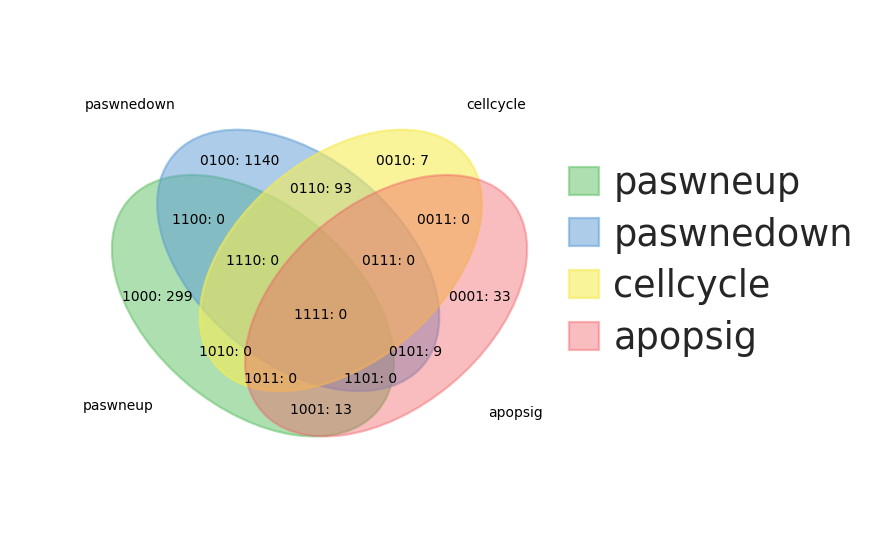

In [77]:
fig, ax = venn.venn4(labels, names=[v for v in testDict.keys()], figsize=(5,3), fontsize=5, dpi=200)


In [78]:
from pyvenn import venn
testDict = {k:gDict[k] for k in ['hallmark_apoptosis','hallmark_epithelial_mesenchymal_transition','hallmark_p53_pathway','apopsig']}
labels = venn.get_labels([v for v in testDict.values()] , fill=['number', 'logic'])
labels

{'0001': '0001: 42',
 '0010': '0010: 171',
 '0011': '0011: 5',
 '0100': '0100: 176',
 '0101': '0101: 3',
 '0110': '0110: 3',
 '0111': '0111: 0',
 '1000': '1000: 123',
 '1001': '1001: 3',
 '1010': '1010: 15',
 '1011': '1011: 2',
 '1100': '1100: 14',
 '1101': '1101: 0',
 '1110': '1110: 4',
 '1111': '1111: 0'}

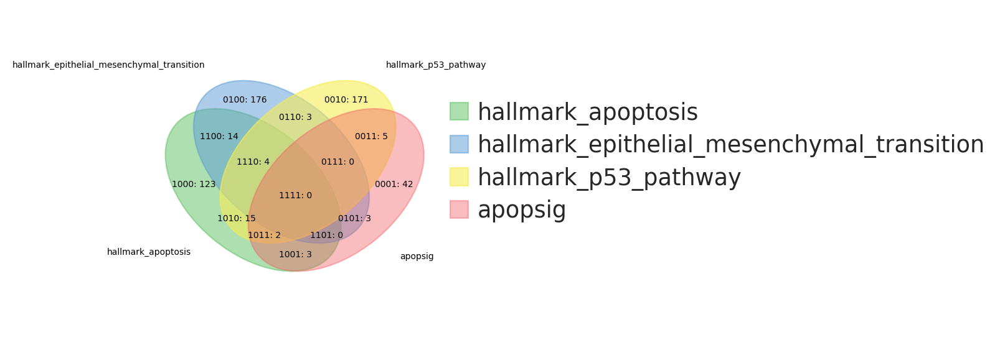

In [79]:
fig, ax = venn.venn4(labels, names=[v for v in testDict.keys()], figsize=(5,3), fontsize=5, dpi=200)


In [8]:
from pyvenn import venn
testDict = {k:gDict[k] for k in ['paswneup','paswnedown','cellcycle','apopsig']}
labels = venn.get_labels([v for v in testDict.values()] , fill=['number', 'logic'])
labels

finished writing 1 gene sets to ../data/GSVA2/CellCycle.gmt
finished writing 1 gene sets to ../data/GSVA2/stress.gmt
finished writing 1 gene sets to ../data/GSVA2/PaRfUp.gmt
finished writing 1 gene sets to ../data/GSVA2/EpiDiff1.gmt
finished writing 1 gene sets to ../data/GSVA2/pantherFAS.gmt
finished writing 1 gene sets to ../data/GSVA2/PaSwneUp.gmt
finished writing 1 gene sets to ../data/GSVA2/hypoxia.gmt
.ipynb_checkpoints
finished writing 1 gene sets to ../data/GSVA2/PaRfDown.gmt
finished writing 1 gene sets to ../data/GSVA2/pantherP53.gmt
finished writing 1 gene sets to ../data/GSVA2/PaSwneDown.gmt
finished writing 1 gene sets to ../data/GSVA2/ApopSig.gmt
finished writing 1 gene sets to ../data/GSVA2/pEMT1.gmt
finished writing 1 gene sets to ../data/GSVA2/EpiDiff2.gmt
finished writing 1 gene sets to ../data/GSVA2/pantherApoptosis.gmt


# TCGA
## GSVA 

In [12]:
keywords = [f.strip('.txt') for f in os.listdir('../db/HNSCC17') if f.endswith('txt')]+['h.all.v6.2.symbols']+[f.strip('.txt') for f in os.listdir('../db/Adapt19') if f.endswith('txt')]
keywords

['CellCycle',
 'stress',
 'EpiDiff1',
 'hypoxia',
 'ApopSig',
 'pEMT1',
 'EpiDiff2',
 'h.all.v6.2.symbols',
 'PaSwneUp',
 'PaRfDown',
 'PaRfUp',
 'PaSwneDown']

In [19]:
for d in ['HNSCC17','Adapt19']:
    for f in os.listdir(f'../db/{d}'):
        try:
            keyword = f.strip('.txt') ### 
            genes = [g for g in np.loadtxt(f'../db/{d}/{f}', dtype=object)]
            gmt_path = '../data/GSVA/%s.gmt'%(keyword)
            sel_dict = {}
            sel_dict[keyword] = genes
            write_gmt(sel_dict, gmt_path)
        except:
            print(f)

finished writing 1 gene sets to ../data/GSVA/CellCycle.gmt
finished writing 1 gene sets to ../data/GSVA/stress.gmt
finished writing 1 gene sets to ../data/GSVA/EpiDiff1.gmt
finished writing 1 gene sets to ../data/GSVA/hypoxia.gmt
.ipynb_checkpoints
finished writing 1 gene sets to ../data/GSVA/ApopSig.gmt
finished writing 1 gene sets to ../data/GSVA/pEMT1.gmt
finished writing 1 gene sets to ../data/GSVA/EpiDiff2.gmt
finished writing 1 gene sets to ../data/GSVA/PaSwneUp.gmt
finished writing 1 gene sets to ../data/GSVA/PaRfDown.gmt
finished writing 1 gene sets to ../data/GSVA/PaRfUp.gmt
finished writing 1 gene sets to ../data/GSVA/PaSwneDown.gmt


In [20]:
!cp ../data_v1/GSVA/h.all.v6.2.symbols.gmt ../data/GSVA

In [33]:
wkdir = '/bgfs/alee/chelsea/projects/10X/CellLine'

for method in ['ssgsea', 'gsva']:
    for sample in ['tcga']:
        for keyword in keywords:
            gmt_path = '{}/data/GSVA/{}.gmt'.format(wkdir, keyword)
            expr_path = '{}/data/TCGA15/{}.logNormCts.csv'.format(wkdir, sample) # gene x cell
            gsvaPrefix = '{}/data/GSVA/{}_{}'.format(wkdir,sample, keyword)

            if not isfile('{}.{}.csv'.format(gsvaPrefix, method)):
                cmd = 'srun -t2:00:00 --cpus-per-task 16 /ihome/crc/install/gcc-8.2.0/r/3.6.0/bin/Rscript %s/codes/GSVA.R %s %s %s %s &\n'%(wkdir, expr_path, gmt_path, gsvaPrefix, method)
                print(cmd)
                

srun -t2:00:00 --cpus-per-task 16 /ihome/crc/install/gcc-8.2.0/r/3.6.0/bin/Rscript /bgfs/alee/chelsea/projects/10X/CellLine/codes/GSVA.R /bgfs/alee/chelsea/projects/10X/CellLine/data/TCGA15/tcga.logNormCts.csv /bgfs/alee/chelsea/projects/10X/CellLine/data/GSVA/CellCycle.gmt /bgfs/alee/chelsea/projects/10X/CellLine/data/GSVA/tcga_CellCycle ssgsea &

srun -t2:00:00 --cpus-per-task 16 /ihome/crc/install/gcc-8.2.0/r/3.6.0/bin/Rscript /bgfs/alee/chelsea/projects/10X/CellLine/codes/GSVA.R /bgfs/alee/chelsea/projects/10X/CellLine/data/TCGA15/tcga.logNormCts.csv /bgfs/alee/chelsea/projects/10X/CellLine/data/GSVA/stress.gmt /bgfs/alee/chelsea/projects/10X/CellLine/data/GSVA/tcga_stress ssgsea &

srun -t2:00:00 --cpus-per-task 16 /ihome/crc/install/gcc-8.2.0/r/3.6.0/bin/Rscript /bgfs/alee/chelsea/projects/10X/CellLine/codes/GSVA.R /bgfs/alee/chelsea/projects/10X/CellLine/data/TCGA15/tcga.logNormCts.csv /bgfs/alee/chelsea/projects/10X/CellLine/data/GSVA/EpiDiff1.gmt /bgfs/alee/chelsea/projects/10

In [52]:
fpath = '/bgfs/alee/chelsea/projects/PublicData/adata/tcga15.h5ad'
tcga = anndata.read_h5ad(fpath)
tcga

AnnData object with n_obs × n_vars = 817 × 20440 
    obs: 'PATIENT_ID', 'OTHER_SAMPLE_ID', 'DAYS_TO_COLLECTION', 'IS_FFPE', 'OCT_EMBEDDED', 'PATHOLOGY_REPORT_FILE_NAME', 'SURGICAL_PROCEDURE_FIRST', 'FIRST_SURGICAL_PROCEDURE_OTHER', 'SURGERY_FOR_POSITIVE_MARGINS', 'SURGERY_FOR_POSITIVE_MARGINS_OTHER', 'MARGIN_STATUS_REEXCISION', 'STAGING_SYSTEM_OTHER', 'MICROMET_DETECTION_BY_IHC', 'METASTATIC_SITE', 'METASTATIC_SITE_OTHER', 'ER_STATUS_BY_IHC', 'ER_STATUS_IHC_PERCENT_POSITIVE', 'ER_POSITIVITY_SCALE_USED', 'IHC_SCORE', 'ER_POSITIVITY_SCALE_OTHER', 'PR_STATUS_BY_IHC', 'PR_STATUS_IHC_PERCENT_POSITIVE', 'PR_POSITIVITY_SCALE_USED', 'PR_POSITIVITY_IHC_INTENSITY_SCORE', 'PR_POSITIVITY_SCALE_OTHER', 'PR_POSITIVITY_DEFINE_METHOD', 'IHC_HER2', 'HER2_IHC_PERCENT_POSITIVE', 'HER2_IHC_SCORE', 'HER2_POSITIVITY_SCALE_OTHER', 'HER2_POSITIVITY_METHOD_TEXT', 'HER2_FISH_STATUS', 'HER2_COPY_NUMBER', 'CENT17_COPY_NUMBER', 'HER2_AND_CENT17_CELLS_COUNT', 'HER2_CENT17_RATIO', 'HER2_AND_CENT17_SCALE_OTHER', 'HE

In [51]:
sample = 'tcga'
method = 'ssgsea'

for n, keyword in enumerate(keywords):

    fpath = '../data/GSVA/{}_{}.{}.csv'.format(sample, keyword, method)
    try:
        tmp = pd.read_csv(fpath, index_col=0)
        gsva = tmp if n==0 else pd.concat((gsva, tmp))
    except:
        print('{}-{}:{} not calculated'.format(sample, method, keyword))
print(gsva.shape)

gsva.columns = [x.replace('.','-') for x in gsva.columns]
gsva.head(3)

(61, 817)


,TCGA-A1-A0SB,TCGA-A1-A0SD,TCGA-A1-A0SE,TCGA-A1-A0SF,TCGA-A1-A0SH,TCGA-A1-A0SI,TCGA-A1-A0SJ,TCGA-A1-A0SK,TCGA-A1-A0SM,TCGA-A1-A0SN,...,TCGA-LL-A5YM,TCGA-LL-A5YN,TCGA-LL-A5YO,TCGA-LL-A5YP,TCGA-LQ-A4E4,TCGA-MS-A51U,TCGA-OL-A66H,TCGA-OL-A66I,TCGA-OL-A66J,TCGA-OL-A66K
CellCycle,0.483952,0.473626,0.686078,0.615778,0.431894,0.797759,0.730997,1.093585,0.629351,0.794397,...,0.898203,0.672481,0.910584,0.906764,0.782424,0.352166,0.619207,0.974928,0.442609,0.456168
stress,1.723947,1.752678,1.539025,1.644581,1.484130,1.780261,1.702598,1.287484,1.698748,1.586163,...,1.459998,1.523054,1.534597,1.860029,1.377242,1.736301,1.622710,1.704760,1.901231,1.792185
EpiDiff1,0.393453,0.521467,0.422056,0.452482,0.410921,0.505897,0.462345,0.289589,0.547598,0.525206,...,0.400487,0.491470,0.565251,0.566727,0.462282,0.477074,0.386749,0.513791,0.486886,0.468999


In [53]:
df_p = tcga.obs.join(gsva.T)
df_p.groupby(['PAM50', 'ONCOTREE_CODE']).size().unstack()

ONCOTREE_CODE,BRCA,IDC,ILC,MDLC
PAM50,,,,
Basal,24.0,107.0,1.0,4.0
Her2,7.0,51.0,2.0,5.0
LumA,52.0,200.0,106.0,57.0
LumB,26.0,122.0,6.0,22.0
Normal,4.0,9.0,12.0,NaN


In [54]:
from pandas.api.types import CategoricalDtype

cat_type = CategoricalDtype(categories=['BRCA','IDC','ILC','MDLC'], ordered=True)
df_p['ONCOTREE_CODE'] = df_p['ONCOTREE_CODE'].astype(cat_type)

cat_type = CategoricalDtype(categories=['Normal','LumA','LumB','Her2','Basal'], ordered=True)
df_p['PAM50'] = df_p['PAM50'].astype(cat_type)

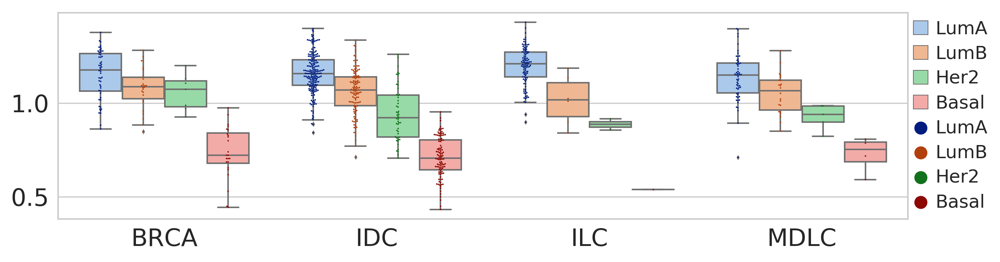

In [60]:
cat_type = CategoricalDtype(categories=['LumA','LumB','Her2','Basal'], ordered=True)
df_p['PAM50'] = df_p['PAM50'].astype(cat_type)


mpl.style.use('NaturePub')
sns.set(context='paper', style='whitegrid', palette='deep', 
        font='sans-serif', font_scale=1.8, color_codes=True)

fig, ax = plt.subplots(figsize=(10,2.5))
sns.boxplot(data=df_p, hue='PAM50',y='ApopSig', x='ONCOTREE_CODE',
            linewidth=1, fliersize=1, palette="pastel")
sns.swarmplot(data=df_p, hue='PAM50',y='ApopSig', x='ONCOTREE_CODE', 
              size=1, palette="dark", dodge=True)

plt.xlabel('')
plt.ylabel('')

plt.legend(loc='center',bbox_to_anchor=(1.05,0.5), fontsize=12)

plt.savefig('../Figure/Fig3/tcga15.ApopSig.ssgsea.pdf')

In [12]:
from scipy.stats import ansariannwhitneyu

VDict = {}
for hist in ['BRCA','IDC','ILC','MDLC']:        
    for pam in ['LumA','LumB','Her2','Basal']:
        x = df_p[(df_p['PAM50']==pam) & (df_p['ONCOTREE_CODE']==hist)]['ApopSig'].values
        VDict['%s_%s'%(pam, hist)] = x

PMat = np.ones((len(VDict),len(VDict)))
for i,x in enumerate(VDict.values()):
    for j,y in enumerate(VDict.values()):
        if len(x) > 10 and len(y) > 10:
            stat, p = mannwhitneyu(x, y)
            PMat[i,j] = p

PDf = pd.DataFrame(PMat, index=VDict.keys(), columns=VDict.keys())
FDR = multipletests(PMat.flatten())[1].reshape(PMat.shape)
FdrDf = pd.DataFrame(FDR, index=VDict.keys(), columns=VDict.keys())
FdrDf

,LumA_BRCA,LumB_BRCA,Her2_BRCA,Basal_BRCA,LumA_IDC,LumB_IDC,Her2_IDC,Basal_IDC,LumA_ILC,LumB_ILC,Her2_ILC,Basal_ILC,LumA_MDLC,LumB_MDLC,Her2_MDLC,Basal_MDLC
LumA_BRCA,1.000000e+00,7.221706e-01,1.0,9.373009e-10,1.000000e+00,3.876111e-03,4.963356e-08,0.000000e+00,9.958566e-01,1.0,1.0,1.0,1.000000e+00,2.277018e-01,1.0,1.0
LumB_BRCA,7.221706e-01,1.000000e+00,1.0,7.385588e-07,9.189569e-02,1.000000e+00,1.289966e-02,7.074341e-13,9.990883e-04,1.0,1.0,1.0,9.884315e-01,1.000000e+00,1.0,1.0
Her2_BRCA,1.000000e+00,1.000000e+00,1.0,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.0,1.0,1.0,1.000000e+00,1.000000e+00,1.0,1.0
Basal_BRCA,9.373009e-10,7.385588e-07,1.0,1.000000e+00,2.642331e-13,5.952239e-11,1.124262e-04,1.000000e+00,3.169465e-12,1.0,1.0,1.0,5.769358e-10,3.908809e-06,1.0,1.0
LumA_IDC,1.000000e+00,9.189569e-02,1.0,2.642331e-13,1.000000e+00,1.096872e-09,2.708944e-14,0.000000e+00,9.716888e-02,1.0,1.0,1.0,1.000000e+00,6.097625e-03,1.0,1.0
LumB_IDC,3.876111e-03,1.000000e+00,1.0,5.952239e-11,1.096872e-09,1.000000e+00,7.134989e-05,0.000000e+00,7.993606e-14,1.0,1.0,1.0,2.044447e-02,1.000000e+00,1.0,1.0
Her2_IDC,4.963356e-08,1.289966e-02,1.0,1.124262e-04,2.708944e-14,7.134989e-05,1.000000e+00,2.708944e-14,0.000000e+00,1.0,1.0,1.0,1.177185e-07,1.537105e-01,1.0,1.0
Basal_IDC,0.000000e+00,7.074341e-13,1.0,1.000000e+00,0.000000e+00,0.000000e+00,2.708944e-14,1.000000e+00,0.000000e+00,1.0,1.0,1.0,0.000000e+00,3.884182e-11,1.0,1.0
LumA_ILC,9.958566e-01,9.990883e-04,1.0,3.169465e-12,9.716888e-02,7.993606e-14,0.000000e+00,0.000000e+00,1.000000e+00,1.0,1.0,1.0,7.611238e-02,5.588315e-05,1.0,1.0
LumB_ILC,1.000000e+00,1.000000e+00,1.0,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.0,1.0,1.0,1.000000e+00,1.000000e+00,1.0,1.0


In [13]:
FdrDf.to_csv('../data/GSVA/tcga_ApopSig.ssgsea.FDR.csv')

## Co-expression scatter

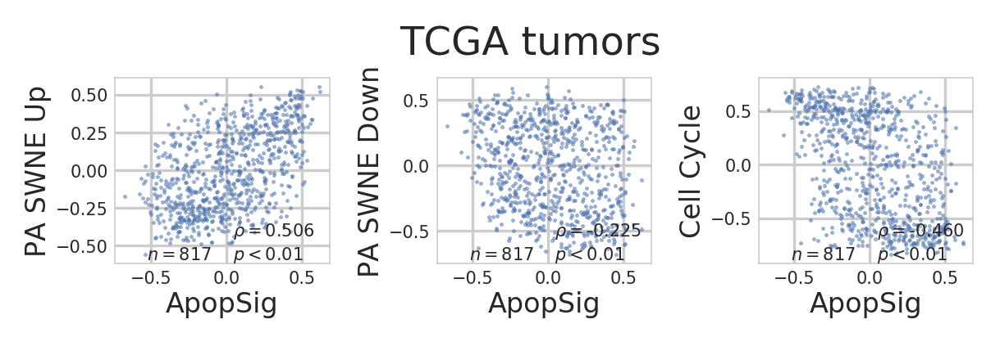

In [23]:
key_sel = ['ApopSig','CellCycle', 'stress', 'PaRfUp', 'EpiDiff1', 'PaSwneUp', 'hypoxia',
       'PaRfDown', 'PaSwneDown', 'pEMT1', 'EpiDiff2']
plot_keys = ['ApopSig','Cell Cycle', 'Stress', 'PA RF Up', 'Epi Diff1', 'PA SWNE Up', 'Hypoxia',
       'PA RF Down', 'PA SWNE Down', 'pEMT1', 'Epi Diff2']

sns.set(context='paper', style='whitegrid', palette='deep', font='sans-serif', 
font_scale=1, color_codes=True)
mpl.style.use('NaturePub')

gsva_sel = gsva.loc[key_sel,:]
gsva_sel.index = plot_keys

from scipy.stats import pearsonr 

x0 = gsva_sel.loc['ApopSig',:].values 
cats = ['PA SWNE Up','PA SWNE Down','Cell Cycle']
nplots = len(cats)
ncols = 3 
nrows = ceil(nplots/ncols)

fig, axes = plt.subplots(ncols=ncols, nrows=nrows, figsize=(ncols*1.5, nrows*1), dpi=300)
plt.subplots_adjust(wspace=.5, hspace=.6) # 
axes_list = axes.flatten()

for n, term in enumerate(cats):
    ax = axes_list[n]

    x1 = gsva_sel.loc[term,:].values 
    rho, p = pearsonr(x0,x1)
    
    ax.set_xlabel('ApopSig', fontsize=8)
    ax.set_ylabel(term, fontsize=8)
    
    ax.scatter(x0,x1,s=.1, alpha=.7)
    ax.text(0.15, 0.02, '${n}=$%d'%len(x0), fontsize=5, transform = ax.transAxes)
    if p < 0.01:
        ax.text(0.55, 0.15, '${\\rho}=$%.3f'%rho, fontsize=5, transform = ax.transAxes)
        ax.text(0.55, 0.02, '${p}<0.01$', fontsize=5, transform = ax.transAxes) 

plt.suptitle('TCGA tumors', y=1.1)
plt.savefig('../Figure/Fig3/SigCorrScatter_tcga.pdf')

## Co-expression heatmap

In [15]:
sample = 'tcga'
method = 'gsva'

for n, keyword in enumerate(keywords):

    fpath = '../data/GSVA/{}_{}.{}.csv'.format(sample, keyword, method)
    try:
        tmp = pd.read_csv(fpath, index_col=0)
        gsva = tmp if n==0 else pd.concat((gsva, tmp))
    except:
        print('{}-{}:{} not calculated'.format(sample, method, keyword))
print(gsva.shape)

gsva.columns = [x.replace('.','-') for x in gsva.columns]
gsva.head(3)

(61, 817)


,TCGA-A1-A0SB,TCGA-A1-A0SD,TCGA-A1-A0SE,TCGA-A1-A0SF,TCGA-A1-A0SH,TCGA-A1-A0SI,TCGA-A1-A0SJ,TCGA-A1-A0SK,TCGA-A1-A0SM,TCGA-A1-A0SN,...,TCGA-LL-A5YM,TCGA-LL-A5YN,TCGA-LL-A5YO,TCGA-LL-A5YP,TCGA-LQ-A4E4,TCGA-MS-A51U,TCGA-OL-A66H,TCGA-OL-A66I,TCGA-OL-A66J,TCGA-OL-A66K
CellCycle,-0.446817,-0.666670,-0.012805,-0.264128,-0.606788,0.465107,0.178894,0.670518,-0.226829,0.443440,...,0.431887,0.094480,0.516155,0.524205,0.260484,-0.743957,-0.196244,0.521304,-0.599415,-0.555157
stress,0.138538,0.276729,-0.375914,-0.116438,-0.116984,0.360967,0.262364,-0.298884,0.271971,-0.079318,...,-0.158175,-0.021692,-0.009582,0.358431,-0.477347,0.134870,-0.067662,0.230733,0.458233,0.297723
EpiDiff1,-0.248265,0.269473,-0.191623,-0.273642,0.118095,0.228631,0.229287,-0.484520,0.388101,0.107974,...,0.043446,0.081479,-0.002070,0.250722,-0.215661,0.217339,-0.342526,-0.087959,0.380660,0.342758


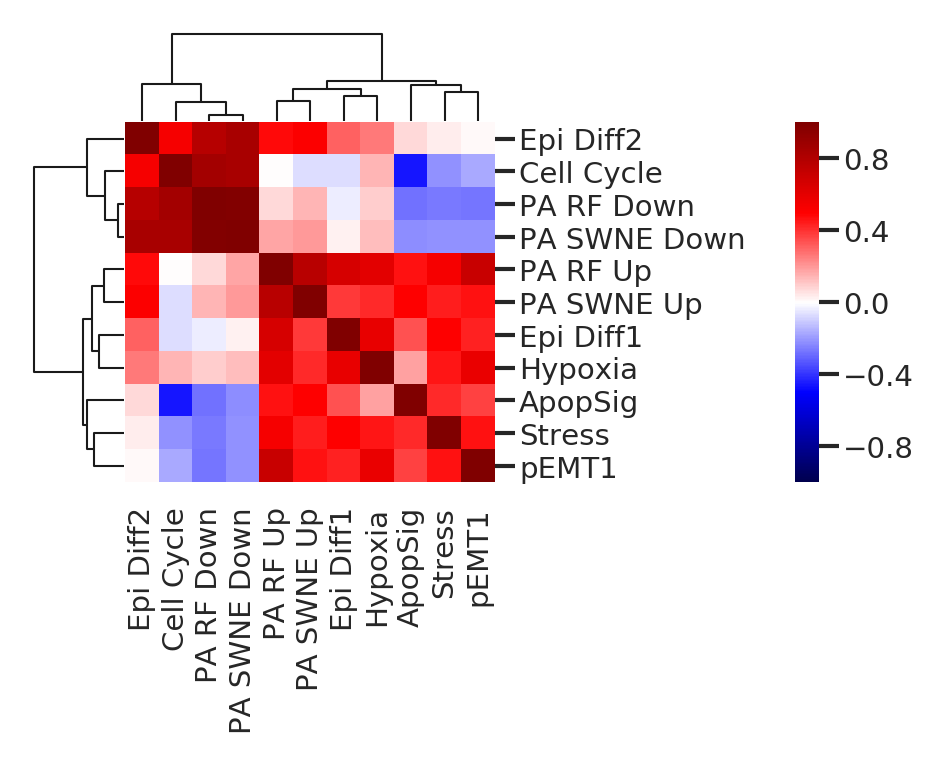

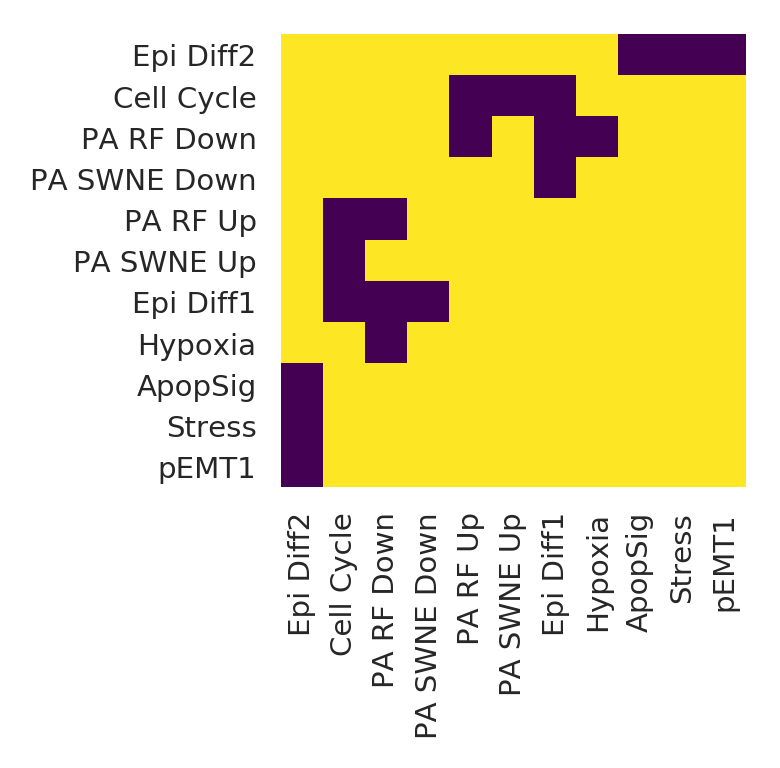

In [16]:
key_sel = ['ApopSig','CellCycle', 'stress', 'PaRfUp', 'EpiDiff1', 'PaSwneUp', 'hypoxia',
       'PaRfDown', 'PaSwneDown', 'pEMT1', 'EpiDiff2']
plot_keys = ['ApopSig','Cell Cycle', 'Stress', 'PA RF Up', 'Epi Diff1', 'PA SWNE Up', 'Hypoxia',
       'PA RF Down', 'PA SWNE Down', 'pEMT1', 'Epi Diff2']


gsva_sel = gsva.loc[key_sel,:]
gsva_sel.index = plot_keys

from scipy.stats import *    
X = gsva_sel.values
Corr = np.empty((X.shape[0], X.shape[0]))
pCorr = np.empty((X.shape[0], X.shape[0])) 

for i in range(X.shape[0]):
    for j in range(X.shape[0]):
        x, y = X[i,:], X[j,:]
        stat, p = pearsonr(x, y)
        Corr[i,j], pCorr[i,j] = stat, p

from statsmodels.stats.multitest import multipletests
fdrCorr = np.reshape(multipletests(pCorr.flatten())[1], pCorr.shape) # FDR
CorrDf = pd.DataFrame(Corr, index=plot_keys, columns=plot_keys)    
fdrCorrDf = pd.DataFrame(fdrCorr, index=plot_keys, columns=plot_keys) 

mpl.style.use('NaturePub')
sns.set(context='paper', style='whitegrid', palette='deep', font='sans-serif', font_scale=.8, color_codes=True)

g1 = sns.clustermap(CorrDf, figsize=(2,2), cmap='seismic', vmin=-1, vmax=1)
cbar = g1.cax
x0,y0,x1,y1 = np.array(g1.ax_heatmap.get_position()).flatten()
cbar.set_position([x1+0.5, y0, 0.04, y1-y0])
g1.savefig('../Figure/Fig3/SigCorrHeatmap_tcga_gsva.png', dpi=300)

xlabels = CorrDf.columns[np.array(g1.dendrogram_col.reordered_ind)]
fdrCorrDf = fdrCorrDf.loc[xlabels,xlabels]
fig = plt.figure(figsize=(2,2))
sns.heatmap(fdrCorrDf<0.05, vmin=0, vmax=1, cmap='viridis', cbar=False)
plt.savefig('../Figure/Fig3/SigFdrCorrHeatmap_tcga_gsva.png', dpi=300)

# AL1

## GSVA
used GSVA - its program clusters appear better than ssGSEA

In [6]:
keywords = [f.strip('.txt') for f in os.listdir('../db/HNSCC17') if f.endswith('txt')]+['h.all.v6.2.symbols']+[f.strip('.txt') for f in os.listdir('../db/Adapt19') if f.endswith('txt')]
keywords

['CellCycle',
 'stress',
 'EpiDiff1',
 'hypoxia',
 'ApopSig',
 'pEMT1',
 'EpiDiff2',
 'h.all.v6.2.symbols',
 'PaSwneUp',
 'PaRfDown',
 'PaRfUp',
 'PaSwneDown']

In [3]:
!ls ../data/Counts

adata_ref_norm.logNormCts.csv


In [4]:
wkdir = '/bgfs/alee/chelsea/projects/10X/CellLine'
sample = 'AL1'

for method in ['ssgsea', 'gsva']:
    for keyword in keywords:
        gmt_path = '{}/data/GSVA/{}.gmt'.format(wkdir, keyword)
        expr_path = '{}/data/Counts/adata_ref_norm.logNormCts.csv'.format(wkdir) # gene x cell
        gsvaPrefix = '{}/data/GSVA/{}_{}'.format(wkdir,sample, keyword)

        if not isfile('{}.{}.csv'.format(gsvaPrefix, method)):
            cmd = 'srun -t2:00:00 --cpus-per-task 12 /ihome/crc/install/gcc-8.2.0/r/3.6.0/bin/Rscript %s/codes/GSVA.R %s %s %s %s &\n'%(wkdir, expr_path, gmt_path, gsvaPrefix, method)
            print(cmd)

srun -t2:00:00 --cpus-per-task 12 /ihome/crc/install/gcc-8.2.0/r/3.6.0/bin/Rscript /bgfs/alee/chelsea/projects/10X/CellLine/codes/GSVA.R /bgfs/alee/chelsea/projects/10X/CellLine/data/Counts/adata_ref_norm.logNormCts.csv /bgfs/alee/chelsea/projects/10X/CellLine/data/GSVA/CellCycle.gmt /bgfs/alee/chelsea/projects/10X/CellLine/data/GSVA/AL1_CellCycle gsva &

srun -t2:00:00 --cpus-per-task 12 /ihome/crc/install/gcc-8.2.0/r/3.6.0/bin/Rscript /bgfs/alee/chelsea/projects/10X/CellLine/codes/GSVA.R /bgfs/alee/chelsea/projects/10X/CellLine/data/Counts/adata_ref_norm.logNormCts.csv /bgfs/alee/chelsea/projects/10X/CellLine/data/GSVA/stress.gmt /bgfs/alee/chelsea/projects/10X/CellLine/data/GSVA/AL1_stress gsva &

srun -t2:00:00 --cpus-per-task 12 /ihome/crc/install/gcc-8.2.0/r/3.6.0/bin/Rscript /bgfs/alee/chelsea/projects/10X/CellLine/codes/GSVA.R /bgfs/alee/chelsea/projects/10X/CellLine/data/Counts/adata_ref_norm.logNormCts.csv /bgfs/alee/chelsea/projects/10X/CellLine/data/GSVA/EpiDiff1.gmt /bgfs/

## Co-expression heatmap

In [5]:
!ls ../data/GSVA/AL1*csv 

../data/GSVA/AL1_ApopSig.ssgsea.csv
../data/GSVA/AL1_CellCycle.ssgsea.csv
../data/GSVA/AL1_EpiDiff1.ssgsea.csv
../data/GSVA/AL1_EpiDiff2.gsva.csv
../data/GSVA/AL1_EpiDiff2.ssgsea.csv
../data/GSVA/AL1_h.all.v6.2.symbols.ssgsea.csv
../data/GSVA/AL1_hypoxia.ssgsea.csv
../data/GSVA/AL1_PaRfDown.ssgsea.csv
../data/GSVA/AL1_PaRfUp.ssgsea.csv
../data/GSVA/AL1_PaSwneDown.ssgsea.csv
../data/GSVA/AL1_PaSwneUp.ssgsea.csv
../data/GSVA/AL1_pEMT1.ssgsea.csv
../data/GSVA/AL1_stress.ssgsea.csv


In [9]:
AL1 = sc.read('../data/scVelo/AL1.h5ad')
CellSeries = AL1.obs['CellType']
CellSeries.head(3) 

index
AL1:AAAGTGAGTCATAGTCx      MM134
AL1:AAAGAACGTAACAAGTx    T47D KO
AL1:AAACGCTGTAGACACGx    T47D WT
Name: CellType, dtype: category
Categories (8, object): [MCF7, T47D WT, T47D KO, MM134, SUM44, BCK4, MCF10A, HEK293]

In [7]:
sample = 'AL1'
method = 'gsva' # gsva

for n, keyword in enumerate(keywords):

    fpath = '../data/GSVA/{}_{}.{}.csv'.format(sample, keyword, method)
    tmp = pd.read_csv(fpath, index_col=0)
    gsva = tmp if n==0 else pd.concat((gsva, tmp))
print(gsva.shape)

gsva.columns = [x.replace('.',':') for x in gsva.columns]
gsva.head(3)

(61, 4614)


,AL1:AAAGTGAGTCATAGTCx,AL1:AAAGAACGTAACAAGTx,AL1:AAACGCTGTAGACACGx,AL1:AAAGGGCCAGCAATTCx,AL1:AACAAAGGTTGAATCCx,AL1:AAAGTGATCCCGAATAx,AL1:AAACGAAAGAGGATCCx,AL1:AAACGCTGTGCCCGTAx,AL1:AAAGTCCAGACATCCTx,AL1:AAAGGGCAGCTGCCTGx,...,AL1:TTTGTTGTCGCCGTGAx,AL1:TTTGTTGCATCATTTCx,AL1:TTTGACTTCGTGTGATx,AL1:TTTGTTGCAGGGTTGAx,AL1:TTTGATCAGGTTGGTGx,AL1:TTTGATCGTTGCACGCx,AL1:TTTGTTGCATCAGCGCx,AL1:TTTGGTTGTGATACAAx,AL1:TTTGACTGTTAGTTCGx,AL1:TTTGTTGGTGATTAGAx
CellCycle,-0.552250,-0.028700,0.463156,0.339022,0.092944,-0.592620,0.145700,-0.650246,0.262285,0.271574,...,0.184865,0.354720,0.259947,0.261725,0.281762,0.332835,-0.440076,-0.260945,-0.457674,-0.447562
stress,-0.147873,-0.216952,-0.207710,-0.109960,-0.175581,0.275161,-0.183166,-0.256205,-0.276914,-0.212674,...,-0.428175,-0.394218,-0.070056,0.200872,0.395085,0.055970,0.148813,0.142175,0.210279,0.460863
EpiDiff1,-0.041352,0.017685,-0.080564,-0.049934,-0.244752,0.313052,-0.413114,0.127037,-0.412217,-0.466611,...,-0.349529,-0.113829,-0.312833,0.068178,-0.036229,-0.003416,0.009531,0.093061,0.158930,0.275038


In [6]:
CellTypes = ['MCF7','T47D WT','T47D KO',  'MM134','SUM44','BCK4',  'MCF10A'] # not using HEK293

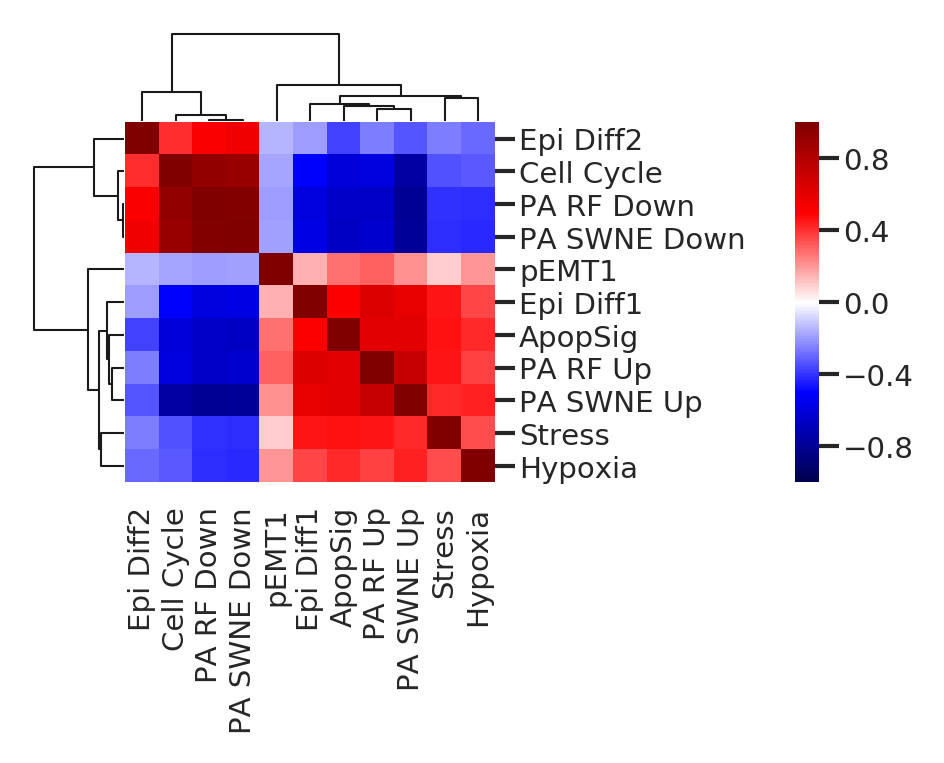

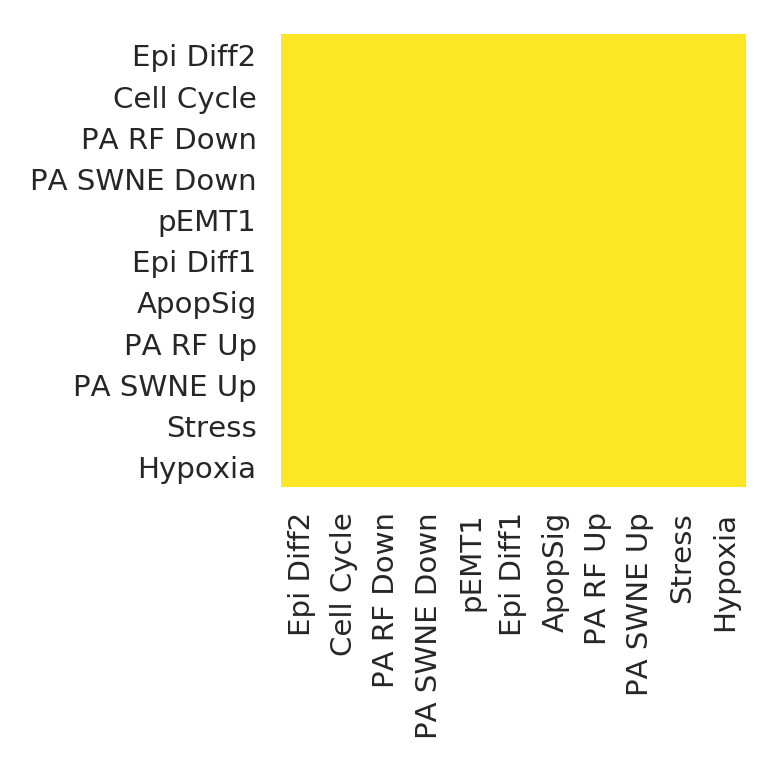

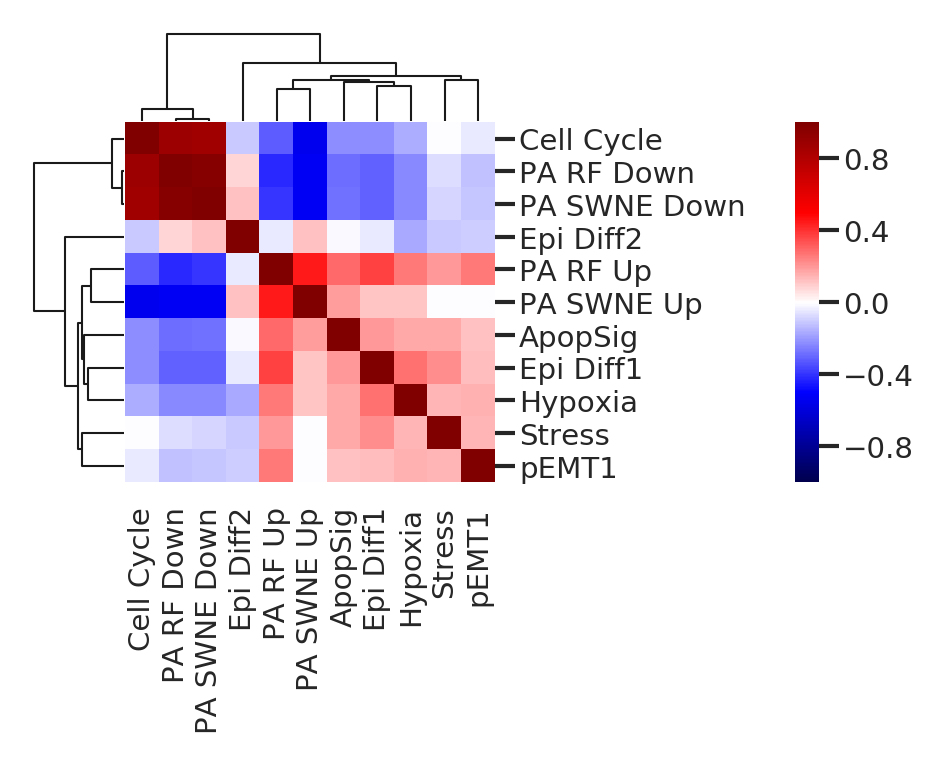

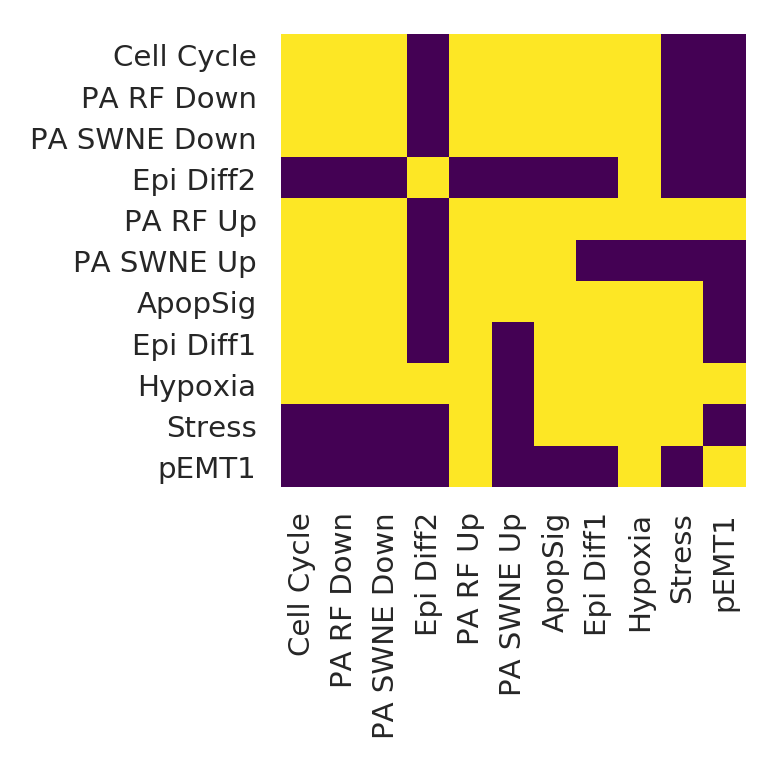

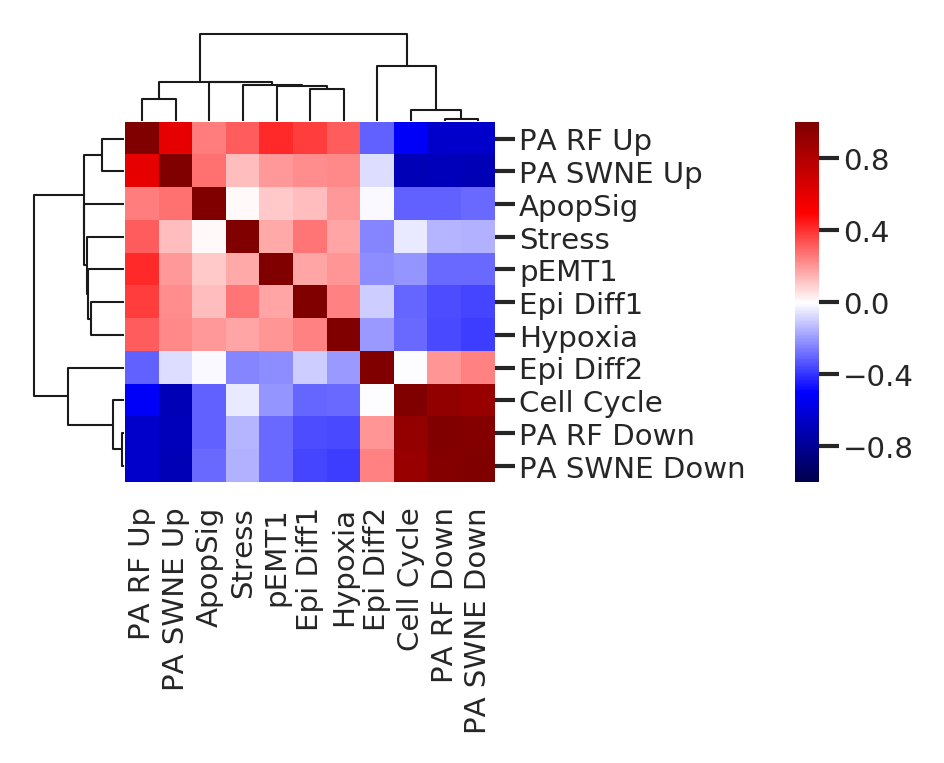

...

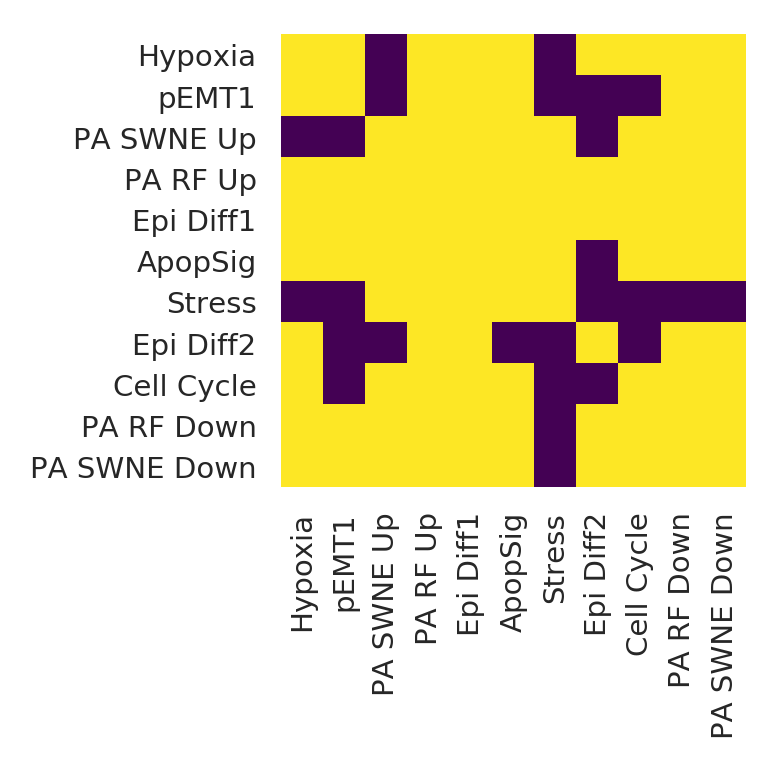

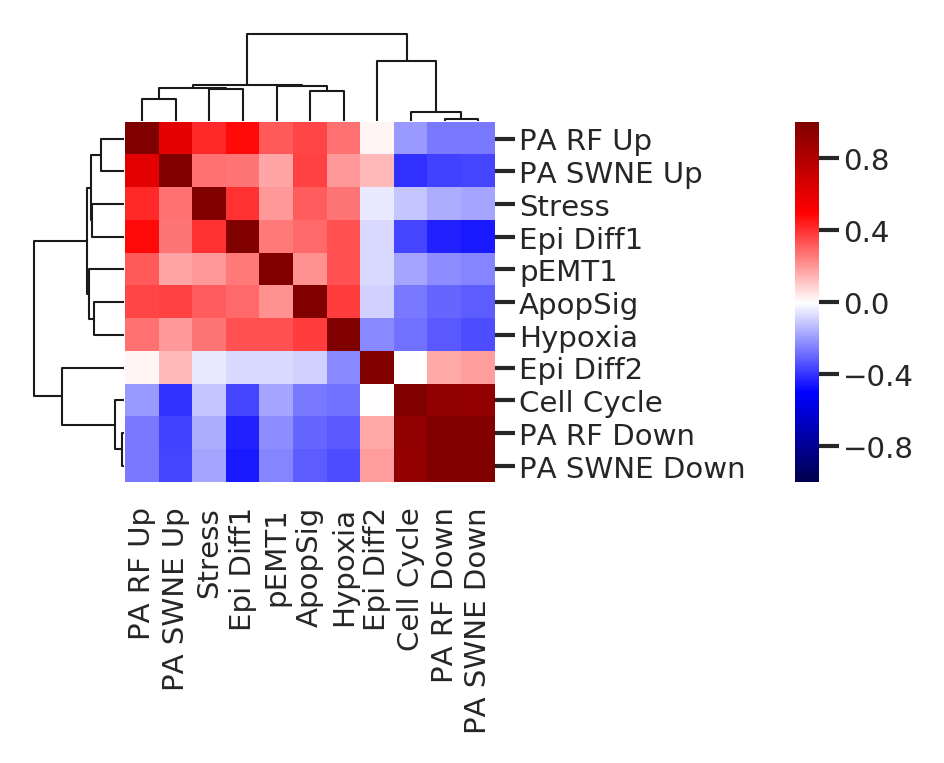

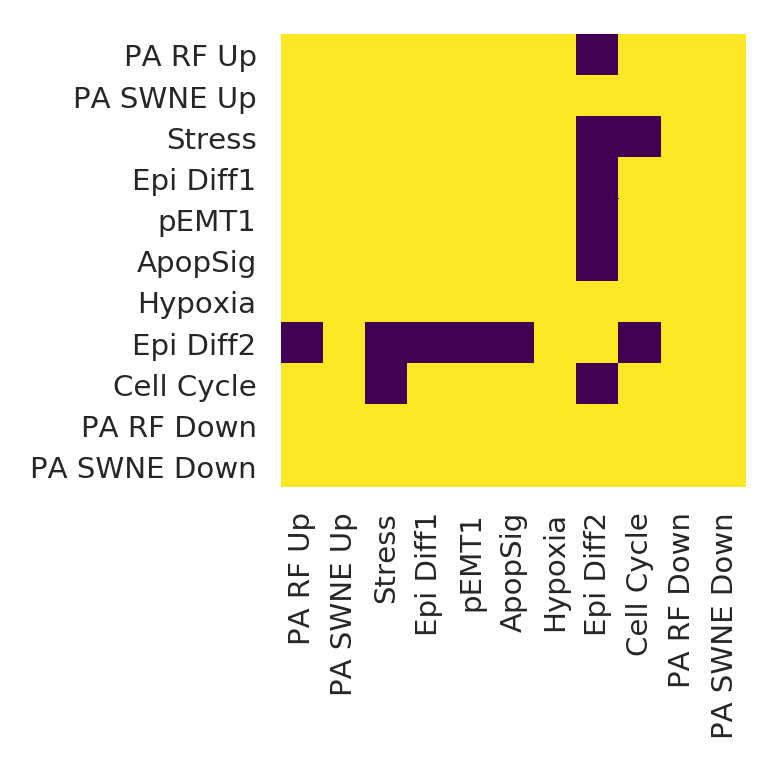

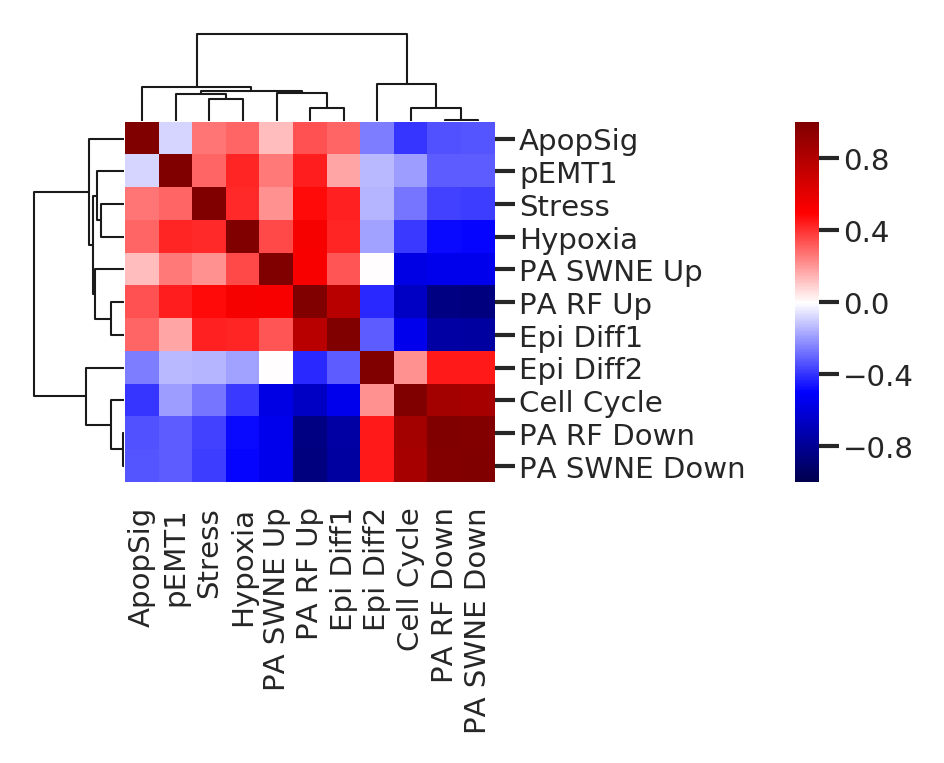

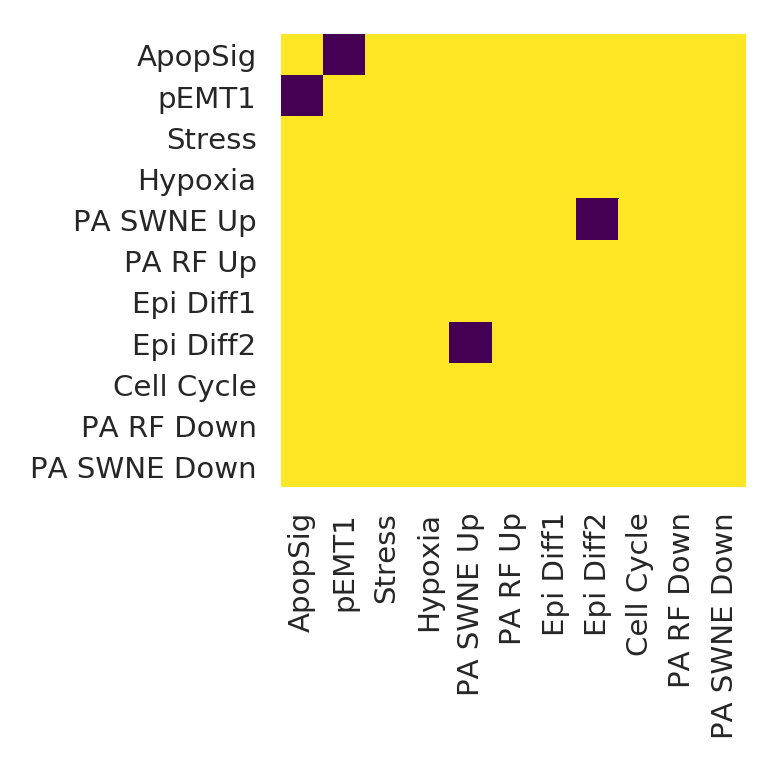

In [9]:
key_sel = ['ApopSig','CellCycle', 'stress', 'PaRfUp', 'EpiDiff1', 'PaSwneUp', 'hypoxia',
       'PaRfDown', 'PaSwneDown', 'pEMT1', 'EpiDiff2']
plot_keys = ['ApopSig','Cell Cycle', 'Stress', 'PA RF Up', 'Epi Diff1', 'PA SWNE Up', 'Hypoxia',
       'PA RF Down', 'PA SWNE Down', 'pEMT1', 'Epi Diff2']


for cell in CellTypes:

    gsva_sel = gsva.T[CellSeries[gsva.columns]==cell].T.loc[key_sel,:]
    gsva_sel.index = plot_keys
    
    from scipy.stats import *    
    X = gsva_sel.values
    Corr = np.empty((X.shape[0], X.shape[0]))
    pCorr = np.empty((X.shape[0], X.shape[0])) 

    for i in range(X.shape[0]):
        for j in range(X.shape[0]):
            x, y = X[i,:], X[j,:]
            stat, p = pearsonr(x, y)
            Corr[i,j], pCorr[i,j] = stat, p

    from statsmodels.stats.multitest import multipletests
    fdrCorr = np.reshape(multipletests(pCorr.flatten())[1], pCorr.shape) # FDR
    CorrDf = pd.DataFrame(Corr, index=plot_keys, columns=plot_keys)    
    fdrCorrDf = pd.DataFrame(fdrCorr, index=plot_keys, columns=plot_keys) 
    
    mpl.style.use('NaturePub')
    sns.set(context='paper', style='whitegrid', palette='deep', font='sans-serif', font_scale=.8, color_codes=True)

    g1 = sns.clustermap(CorrDf, figsize=(2,2), cmap='seismic', vmin=-1, vmax=1)
    cbar = g1.cax
    x0,y0,x1,y1 = np.array(g1.ax_heatmap.get_position()).flatten()
    cbar.set_position([x1+0.5, y0, 0.04, y1-y0])
    g1.savefig('../Figure/Fig3/SigCorrHeatmap_AL1_%s_gsva.png'%cell, dpi=300)

    xlabels = CorrDf.columns[np.array(g1.dendrogram_col.reordered_ind)]
    fdrCorrDf = fdrCorrDf.loc[xlabels,xlabels]
    fig = plt.figure(figsize=(2,2))
    sns.heatmap(fdrCorrDf<0.05, vmin=0, vmax=1, cmap='viridis', cbar=False)
    plt.savefig('../Figure/Fig3/SigFdrCorrHeatmap_AL1_%s_gsva.png'%cell, dpi=300)

## co-expression scatter

In [12]:
gsva_sel

,AL1:AAAGGGCCAGCAATTCx,AL1:AACAAAGGTTGAATCCx,AL1:AAAGTGACAGACTCTAx,AL1:AAACGCTGTCTACAACx,AL1:AACAAAGGTCAAAGATx,AL1:AAAGGGCGTCAAACGGx,AL1:AAAGGGCTCACCATGAx,AL1:AAACCCACAAATGATGx,AL1:AAACGAATCACCATAGx,AL1:AAAGGATTCTTACGGAx,...,AL1:TTTATGCAGATCGCTTx,AL1:TTTACTGTCAAGAATGx,AL1:TTTCCTCCATTCACCCx,AL1:TTTACTGAGCCTCTCTx,AL1:TTTCCTCGTCCGAAAGx,AL1:TTTACTGCACTCATAGx,AL1:TTTACGTGTGTCATTGx,AL1:TTGTTTGAGTCACGAGx,AL1:TTTGACTTCGTGTGATx,AL1:TTTGTTGCATCAGCGCx
CellCycle,0.339022,0.092944,0.246135,0.314444,0.411175,0.488048,0.380578,0.252482,0.532653,0.378164,...,0.425381,-0.788772,0.203281,-0.770411,0.259217,0.318368,0.191777,0.261895,0.259947,-0.440076
stress,-0.109960,-0.175581,-0.095307,-0.232634,-0.162019,-0.133784,-0.306832,-0.298068,-0.153435,-0.032012,...,-0.159369,0.149298,-0.082680,0.395926,-0.038865,-0.111670,-0.128863,-0.149559,-0.070056,0.148813
EpiDiff1,-0.049934,-0.244752,-0.261376,-0.193237,-0.083722,-0.115502,-0.171201,-0.140463,-0.165890,-0.140622,...,-0.269953,0.115856,-0.208215,0.089556,-0.349855,-0.257275,-0.119121,0.009879,-0.312833,0.009531
hypoxia,-0.343158,-0.177533,-0.309099,-0.029643,-0.230821,-0.152573,-0.173935,-0.025971,-0.211549,-0.185513,...,-0.317038,0.182293,-0.203145,0.403392,0.008586,-0.047814,-0.092763,-0.050213,0.074723,0.223008
ApopSig,-0.221116,-0.114275,-0.219815,-0.171011,-0.343974,-0.313099,-0.286340,0.071006,-0.218405,-0.314460,...,-0.088992,0.329715,-0.421896,0.447166,-0.063724,-0.383053,0.036619,-0.404961,-0.294296,-0.126428
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
HALLMARK_PANCREAS_BETA_CELLS,-0.158030,0.147196,-0.161000,-0.255407,-0.331991,-0.193421,-0.189213,0.051229,-0.362911,-0.293671,...,-0.115368,-0.306946,-0.373846,-0.027489,-0.217946,-0.185018,-0.180017,-0.058742,-0.112147,-0.194446
PaSwneUp,-0.116021,-0.142281,-0.125164,-0.090102,-0.024974,-0.064658,0.021229,0.019252,-0.149992,-0.111285,...,-0.168679,0.481172,-0.077183,0.493291,-0.002682,0.026169,-0.046495,-0.016423,0.035784,0.300826
PaRfDown,0.270439,0.304388,0.300987,0.350224,0.314081,0.297502,0.339524,0.352437,0.345067,0.316848,...,0.356389,-0.423891,0.341529,-0.401144,0.341661,0.308324,0.313236,0.313989,0.331841,-0.045422
PaRfUp,-0.003923,-0.175577,-0.099513,-0.068625,0.042613,-0.057165,-0.045570,-0.089585,-0.064329,-0.051549,...,-0.128060,0.221298,-0.123818,0.278450,-0.046997,-0.064783,0.022769,-0.060022,-0.100073,0.101593


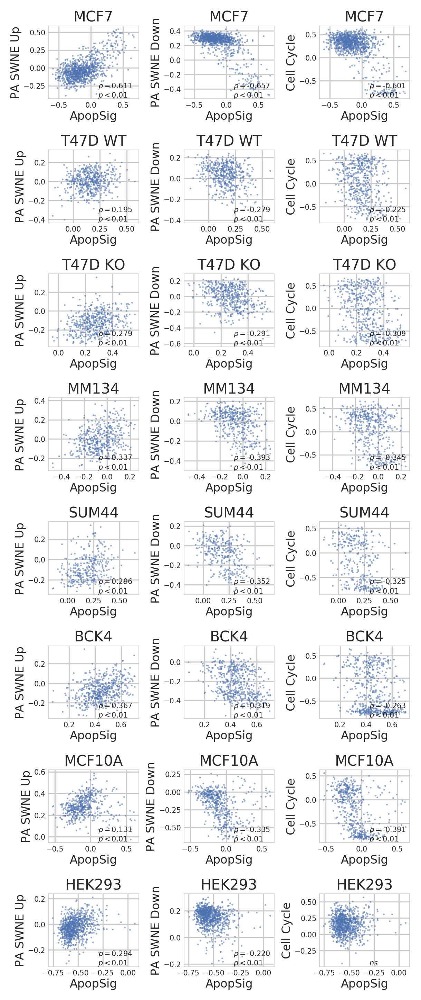

In [21]:
key_sel = ['ApopSig','CellCycle', 'stress', 'PaRfUp', 'EpiDiff1', 'PaSwneUp', 'hypoxia',
       'PaRfDown', 'PaSwneDown', 'pEMT1', 'EpiDiff2']
plot_keys = ['ApopSig','Cell Cycle', 'Stress', 'PA RF Up', 'Epi Diff1', 'PA SWNE Up', 'Hypoxia',
       'PA RF Down', 'PA SWNE Down', 'pEMT1', 'Epi Diff2']

sns.set(context='paper', style='whitegrid', palette='deep', font='sans-serif', 
font_scale=1, color_codes=True)
mpl.style.use('NaturePub')

gsva_sel = gsva.loc[key_sel,:]
gsva_sel.index = plot_keys

from scipy.stats import pearsonr 

cats = ['PA SWNE Up','PA SWNE Down','Cell Cycle']
nplots = len(cats) * len(CellTypes)
ncols = 3 
nrows = ceil(nplots/ncols)

fig, axes = plt.subplots(ncols=ncols, nrows=nrows, figsize=(ncols*1.5, nrows*1.5), dpi=300)
plt.subplots_adjust(wspace=.5, hspace=.7) # 
axes_list = axes.flatten()

n = -1
for cell in CellTypes:

    bcs = np.array(list(CellSeries.index[CellSeries[gsva.columns]==cell]))
    tmp = gsva_sel.loc[:,bcs]
    
    x0 = tmp.loc['ApopSig',:].values 
    for term in cats:
        n += 1
        ax = axes_list[n]

        x1 = tmp.loc[term,:].values 
        rho, p = pearsonr(x0,x1)

        ax.set_title(cell, fontsize=10, pad=3)
        ax.set_xlabel('ApopSig', fontsize=8)
        ax.set_ylabel(term, fontsize=8)

        ax.scatter(x0,x1,s=.1, alpha=.7)
        if p < 0.01:
            ax.text(0.55, 0.15, '${\\rho}=$%.3f'%rho, fontsize=5, transform = ax.transAxes)
            ax.text(0.55, 0.02, '${p}<0.01$', fontsize=5, transform = ax.transAxes) 
        else:
            ax.text(0.55, 0.02, '${ns}$', fontsize=5, transform = ax.transAxes) 
plt.savefig('../Figure/Fig3/SigCorrScatter_AL1.pdf')


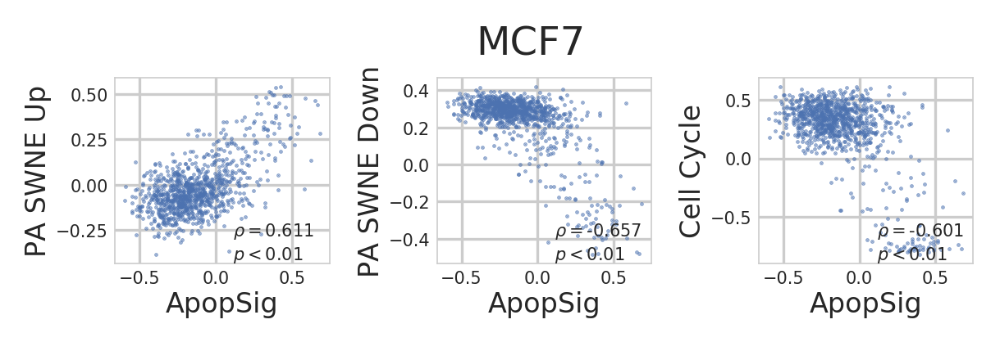

In [29]:
cell = 'MCF7'
bcs = np.array(list(CellSeries.index[CellSeries[gsva.columns]==cell]))
tmp = gsva_sel.loc[:,bcs]

x0 = gsva_sel.loc['ApopSig',:].values 
cats = ['PA SWNE Up','PA SWNE Down','Cell Cycle']
nplots = len(cats)
ncols = 3 
nrows = ceil(nplots/ncols)

fig, axes = plt.subplots(ncols=ncols, nrows=nrows, figsize=(ncols*1.5, nrows*1), dpi=300)
plt.subplots_adjust(wspace=.5, hspace=.6) # 
axes_list = axes.flatten()

x0 = tmp.loc['ApopSig',:].values 
for n,term in enumerate(cats):
    ax = axes_list[n]

    x1 = tmp.loc[term,:].values 
    rho, p = pearsonr(x0,x1)
    
    ax.set_xlabel('ApopSig', fontsize=8)
    ax.set_ylabel(term, fontsize=8)

    ax.scatter(x0,x1,s=.1, alpha=.7)
    if p < 0.01:
        ax.text(0.55, 0.15, '${\\rho}=$%.3f'%rho, fontsize=5, transform = ax.transAxes)
        ax.text(0.55, 0.02, '${p}<0.01$', fontsize=5, transform = ax.transAxes) 
    else:
        ax.text(0.55, 0.02, '${ns}$', fontsize=5, transform = ax.transAxes) 
plt.suptitle('MCF7', y=1.1)
plt.savefig('../Figure/Fig3/SigCorrScatter_MCF7.pdf')


## Cell Cycle Dynamics in  MCF7

In [10]:
key_sel = ['ApopSig','CellCycle', 'stress', 'PaRfUp', 'EpiDiff1', 'PaSwneUp', 'hypoxia',
       'PaRfDown', 'PaSwneDown', 'pEMT1', 'EpiDiff2']
plot_keys = ['ApopSig','Cell Cycle', 'Stress', 'PA RF Up', 'Epi Diff1', 'PA SWNE Up', 'Hypoxia',
       'PA RF Down', 'PA SWNE Down', 'pEMT1', 'Epi Diff2']

gsva_sel = gsva.T[CellSeries[gsva.columns]=='MCF7'].T.loc[key_sel,:]
gsva_sel.index = plot_keys


In [3]:
from utils import * 

In [3]:
import scanpy as sc
import scvelo as scv
# MCF7 = sc.read('../data/scVelo/MCF7.h5ad')
MCF7

AnnData object with n_obs × n_vars = 977 × 5000 
    obs: 'Clusters', '_X', '_Y', 'doublet_bln', 'doublet_score', 'percent_mito', 'n_counts', 'n_genes', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size', 'louvain', 'CellType', 'phase', 'G2', 'M/G1', 'G1/S', 'G2/M', 'S phase', 'CNV_cluster', 'NMF_cluster'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'means', 'dispersions', 'dispersions_norm'
    uns: 'draw_graph', 'louvain', 'neighbors', 'pca'
    obsm: 'X_draw_graph_fa', 'X_pca'
    varm: 'PCs'
    layers: 'Ms', 'Mu', 'ambiguous', 'matrix', 'spliced', 'unspliced'

saving figure to file ./figures/scvelo_2D_MCF7_gsva.pdf


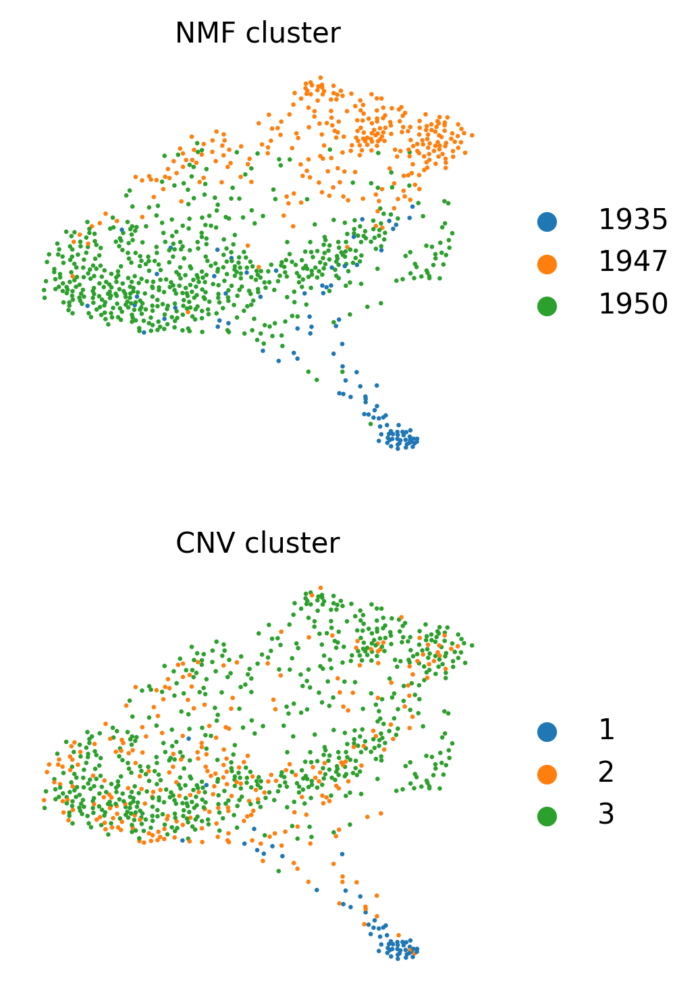

In [10]:
scv.pl.scatter(MCF7, color=['NMF_cluster', 'CNV_cluster'], 
                       legend_loc='right margin', basis='draw_graph_fa', ncols=1, color_map='coolwarm',
                       figsize=(3,3), size=10, dpi=300, save='2D_MCF7_gsva')

In [13]:
MCF7.obs.groupby(['NMF_cluster','phase']).size().unstack()
# 1947 (NMF cluster: mitotic) 
237 / 286 = 83%
# 1950 (NMF cluster: majority, non-mitotic)
(69+259+185)/589 = 87%

phase,M/G1,G1/S,S phase,G2,G2/M
NMF_cluster,,,,,
1935,15,50,15,18,4
1947,42,4,3,140,97
1950,69,259,185,41,35


In [9]:
from collections import Counter
Counter(MCF7.obs['NMF_cluster']), Counter(MCF7.obs['CNV_cluster'])

(Counter({'1950': 589, '1947': 286, '1935': 102}),
 Counter({'3': 652, '2': 269, '1': 56}))

In [13]:
cell = 'MCF7'
gsva_sel = gsva.T[CellSeries[gsva.columns]==cell].T.loc[key_sel,:]
gsva_sel.index = plot_keys

tmp.obs = tmp.obs.join(gsva_sel.T) 

saving figure to file ./figures/scvelo_2D_MCF7_gsva.pdf


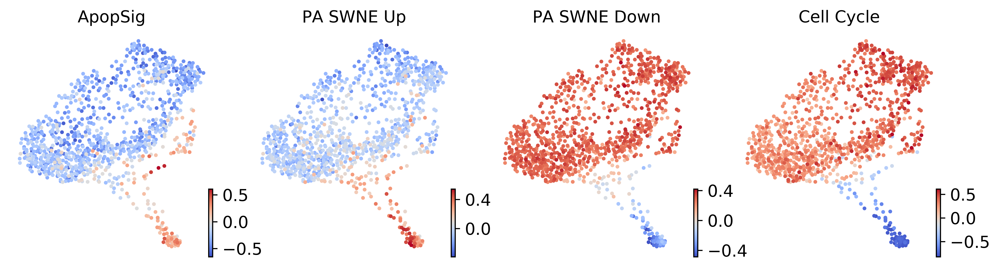

In [21]:
# scv.settings.set_figure_params('scvelo')
scv.pl.scatter(tmp, color=['ApopSig', 'PA SWNE Up', 'PA SWNE Down', 'Cell Cycle'], 
                       legend_loc='right margin', basis='draw_graph_fa', ncols=4, color_map='coolwarm',
                       figsize=(3,3), size=30, dpi=300, save='2D_MCF7_gsva')



In [ ]:
scv.pl.scatter(tmp, color=['Latent'], 
                       legend_loc='right margin', basis='draw_graph_fa', ncols=4, palette='viridis',
                       figsize=(3,3), size=30, dpi=300, save='2D_MCF7_gsva')


In [19]:
CellCycleDict = pickle.load(open("../data/scVelo/CellCycleAdataDict.pkl", "rb"))
CellDict = pickle.load(open("../data/CNV/Cell_CNV_AdataDict.pkl","rb"))
Corr_dict = pickle.load(open('../data/scVelo/CycleGene_PearsonCorrDict.pkl', 'rb'))  

MCF7 G2/M High Corr CycleGenes: 21
MCF7 G1/S High Corr CycleGenes: 9
MCF7 M/G1 High Corr CycleGenes: 10
MCF7 G2 High Corr CycleGenes: 14
MCF7 S phase High Corr CycleGenes: 9
computing velocity embedding
    finished (0:00:00) --> added
    'velocity_draw_graph_fa', embedded velocity vectors (adata.obsm)
saving figure to file ./figures/scvelo_2D_MCF7_velo.pdf


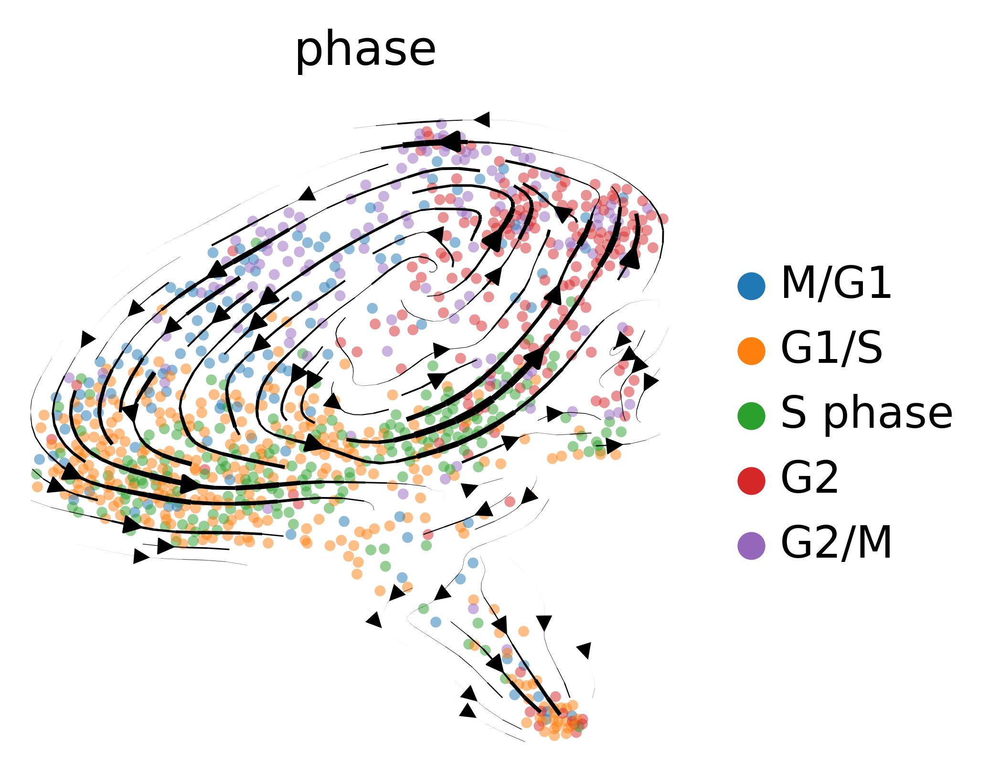

saving figure to file ./figures/scvelo_2D_MCF7_time.pdf


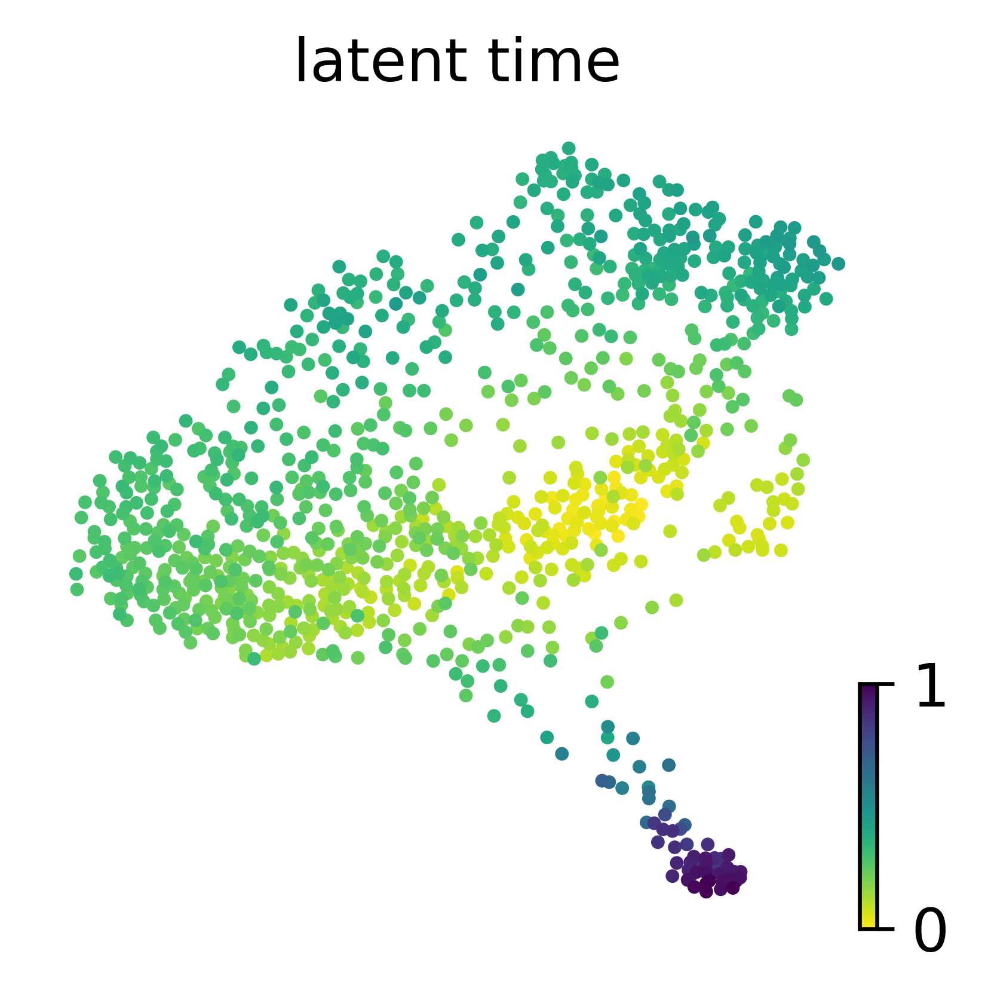

In [20]:
from scanpy.tools._score_genes import score_genes

phases = ['M/G1', 'G1/S', 'S phase', 'G2', 'G2/M']

for n, cell in enumerate(['MCF7']):  
    
    tmp_cycle = CellCycleDict[cell]
    tmp_cycle.obsm['X_draw_graph_fa'] = CellDict[cell].obsm['X_draw_graph_fa']
    
    # calc phase score
    genes_cycle = {}
    for phase, series in Corr_dict[cell].items():
        if len(series) > 1:
            genes_s = series[series.values > np.quantile(series.values, 0.6)].index.tolist()
            genes_cycle[phase] = genes_s
            score_genes(tmp, gene_list=genes_s, score_name=phase, ctrl_size=len(genes_s)) # use adata.X for scoring
            print(cell, phase, 'High Corr CycleGenes:', len(genes_s))

    # annotate phase       
#     df_p_val = zscore(zscore(tmp.obs[phases], axis=0), axis=1) # first standardize PHASE/col-wise; then standardize CELL/row-wise # modify scores into Z-scores
    df_p_val = tmp.obs[phases]
    df_p = pd.DataFrame(df_p_val, index=tmp.obs.index, columns=phases)
    
    scv.pl.velocity_embedding_stream(tmp_cycle, basis='draw_graph_fa', color='phase', size=30, 
                                     smooth=1, color_map='viridis',
                                 figsize=(3,3), linewidth=1, dpi=300, density=0.5,
                                 legend_loc='right margin', alpha=0.5, save='2D_MCF7_velo')

    scv.pl.scatter(tmp_cycle, color=['latent_time'], basis='draw_graph_fa', 
                   ncols=3, legend_loc='right margin', size=30, figsize=(3,3), dpi=300, xlabel=cell, save='2D_MCF7_time')


In [22]:
!mv ./figures/* ../Figure/Fig3 


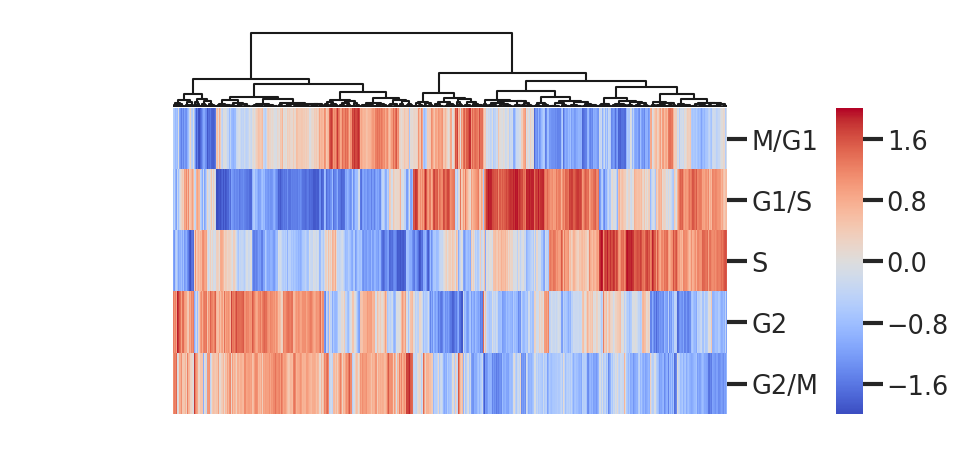

In [50]:
mpl.style.use('NaturePub')
sns.set(context='paper', style='whitegrid', palette='deep', font='sans-serif', 
font_scale=.7, color_codes=True)


df_p_val = zscore(zscore(tmp.obs[phases], axis=0), axis=1) # first standardize PHASE/col-wise; then standardize CELL/row-wise # modify scores into Z-scores
df_zscore = pd.DataFrame(df_p_val, index=tmp.obs.index, columns=phases)

g = sns.clustermap(df_zscore.T, row_cluster=False,
                  method='ward', metric='euclidean', cmap='coolwarm', figsize=(3,1.7))
g.ax_heatmap.set_xticklabels('')
g.ax_heatmap.set_xlabel('')

g.ax_heatmap.set_yticklabels(['M/G1','G1/S','S','G2','G2/M'])
plt.setp([g.ax_heatmap.yaxis.get_majorticklabels()], rotation=0)

cbar = g.cax
x0,y0,x1,y1 = np.array(g.ax_heatmap.get_position()).flatten()
cbar.set_position([x1+0.12, y0, 0.03, y1-y0])

g.savefig('../Figure/Fig3/CellCycleHeatmap_MCF7.png', dpi=300, bbox_inches='tight')

# BroadMCF7

## Co-expression of ApopSig and Other Sigs

In [1]:
!ls ../data/GSVA2/BroadMCF7* 

../data/GSVA2/BroadMCF7_SRR10018059_ApopSig.gsva.csv
../data/GSVA2/BroadMCF7_SRR10018059_ApopSig.ssgsea.csv
../data/GSVA2/BroadMCF7_SRR10018059_CellCycle.gsva.csv
../data/GSVA2/BroadMCF7_SRR10018059_CellCycle.ssgsea.csv
../data/GSVA2/BroadMCF7_SRR10018059_EpiDiff1.gsva.csv
../data/GSVA2/BroadMCF7_SRR10018059_EpiDiff1.ssgsea.csv
../data/GSVA2/BroadMCF7_SRR10018059_EpiDiff2.gsva.csv
../data/GSVA2/BroadMCF7_SRR10018059_EpiDiff2.ssgsea.csv
../data/GSVA2/BroadMCF7_SRR10018059_h.all.v6.2.symbols.gsva.csv
../data/GSVA2/BroadMCF7_SRR10018059_h.all.v6.2.symbols.ssgsea.csv
../data/GSVA2/BroadMCF7_SRR10018059_hypoxia.gsva.csv
../data/GSVA2/BroadMCF7_SRR10018059_hypoxia.ssgsea.csv
../data/GSVA2/BroadMCF7_SRR10018059_PaRfDown.gsva.csv
../data/GSVA2/BroadMCF7_SRR10018059_PaRfDown.ssgsea.csv
../data/GSVA2/BroadMCF7_SRR10018059_PaRfUp.gsva.csv
../data/GSVA2/BroadMCF7_SRR10018059_PaRfUp.ssgsea.csv
../data/GSVA2/BroadMCF7_SRR10018059_PaSwneDown.gsva.csv
../data/GSVA2/BroadMCF7_SRR10018059_PaSwneDown.ssg

In [7]:
sns.set(context='paper', style='whitegrid', palette='deep', font='sans-serif', 
font_scale=1, color_codes=True)
mpl.style.use('NaturePub')

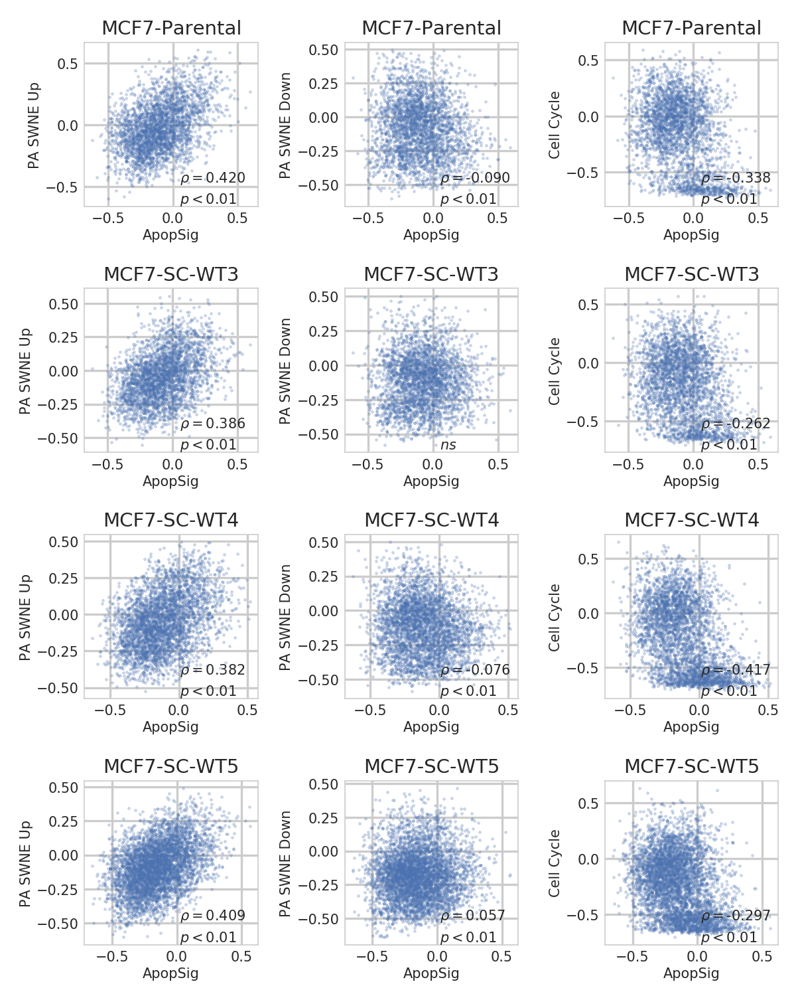

In [40]:
#
labelDict = {'SRR10018059': 'MCF7-Parental',
 'SRR10018060': 'MCF7-Parental',
 'SRR10018061': 'MCF7-SC-WT3',
 'SRR10018062': 'MCF7-SC-WT3',
 'SRR10018063': 'MCF7-SC-WT4',
 'SRR10018064': 'MCF7-SC-WT4',
 'SRR10018065': 'MCF7-SC-WT5',
 'SRR10018066': 'MCF7-SC-WT5',
 'SRR10018067': 'MCF7-L',
 'SRR10018068': 'MCF7-L',
 'SRR10018069': 'MCF7-clone9-May',
 'SRR10018070': 'MCF7-clone9-May',
 'SRR10018071': 'MCF7-clone9-Nov',
 'SRR10018072': 'MCF7-clone9-Nov',
 'SRR10018149': 'MCF7-AA-t0',
 'SRR10018150': 'MCF7-AA-t12',
 'SRR10018151': 'MCF7-AA-t48',
 'SRR10018152': 'MCF7-AA-t96'}

sample = 'BroadMCF7'
method = 'gsva'

cats = ['ApopSig','PaSwneUp','PaSwneDown','CellCycle']
samples = ['SRR10018059','SRR10018061','SRR10018063','SRR10018065']
nplots = 3 * len(samples)
ncols = 3 
nrows = ceil(nplots/ncols)

fig, axes = plt.subplots(ncols=ncols, nrows=nrows, figsize=(ncols*1.5, nrows*1.5), dpi=300)
plt.subplots_adjust(wspace=.5, hspace=.5) # 
axes_list = axes.flatten()

k = -1
from scipy.stats import pearsonr
for sp in samples:
    for n, term in enumerate(cats):
        
        fpath = '../data/GSVA2/{}_{}_{}.{}.csv'.format(sample, sp, term, method)
        tmp = pd.read_csv(fpath, index_col=0)
        gsva = tmp if n==0 else pd.concat((gsva, tmp))
    
    gsva.index = ['ApopSig' if x=='MCF7_EndSigUp' else x for x in gsva.index]
    gsva.columns = [x.replace('.',':') for x in gsva.columns]
    gsva_sel = gsva.loc[cats,:]
    gsva_sel.index = ['ApopSig','PA SWNE Up','PA SWNE Down','Cell Cycle']
          
    x0 = gsva_sel.loc['ApopSig',:].values 

    for term in ['PA SWNE Up','PA SWNE Down','Cell Cycle']:
        k += 1
        ax = axes_list[k]

        x1 = gsva_sel.loc[term,:].values 
        rho, p = pearsonr(x0,x1)

        ax.set_title(labelDict[sp], fontsize=7, pad=3)
        ax.set_xlabel('ApopSig', fontsize=5)
        ax.set_ylabel(term, fontsize=5)

        ax.scatter(x0,x1,s=.05, alpha=0.5)
        if p < 0.01:
            ax.text(0.55, 0.15, '${\\rho}=$%.3f'%rho, fontsize=5, transform = ax.transAxes)
            ax.text(0.55, 0.02, '${p}<0.01$', fontsize=5, transform = ax.transAxes) 
        else:
            ax.text(0.55, 0.02, '$ns$', fontsize=5, transform = ax.transAxes) 
plt.savefig('../Figure/Fig3/SigCorrScatter_Broad_MCF7.png', dpi=300, bbox_inches='tight')


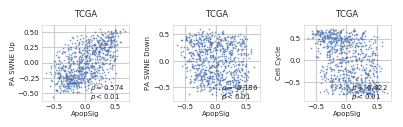

In [55]:
key_sel = ['ApopSig','CellCycle', 'stress', 'PaRfUp', 'EpiDiff1', 'PaSwneUp', 'hypoxia',
       'PaRfDown', 'PaSwneDown', 'pEMT1', 'EpiDiff2']
plot_keys = ['ApopSig','Cell Cycle', 'Stress', 'PA RF Up', 'Epi Diff1', 'PA SWNE Up', 'Hypoxia',
       'PA RF Down', 'PA SWNE Down', 'pEMT1', 'Epi Diff2']

sns.set(context='paper', style='whitegrid', palette='deep', font='sans-serif', 
font_scale=1, color_codes=True)
mpl.style.use('NaturePub')

gsva_sel = gsva.loc[key_sel,:]
gsva_sel.index = plot_keys

from scipy.stats import pearsonr 

x0 = gsva_sel.loc['ApopSig',:].values 
cats = ['PA SWNE Up','PA SWNE Down','Cell Cycle']
nplots = len(cats)
ncols = 3 
nrows = ceil(nplots/ncols)

fig, axes = plt.subplots(ncols=ncols, nrows=nrows, figsize=(ncols*1.5, nrows*1), dpi=100)
plt.subplots_adjust(wspace=.5, hspace=0) # 
axes_list = axes.flatten()

for n, term in enumerate(cats):
    ax = axes_list[n]

    x1 = gsva_sel.loc[term,:].values 
    rho, p = pearsonr(x0,x1)
    
    ax.set_title('TCGA', fontsize=6)
    ax.set_xlabel('ApopSig', fontsize=5)
    ax.set_ylabel(term, fontsize=5)
    
    ax.scatter(x0,x1,s=.1)
    ax.text(0.55, 0.15, '${\\rho}=$%.3f'%rho, fontsize=5, transform = ax.transAxes)
    if p < 0.01:
        ax.text(0.55, 0.02, '${p}<0.01$', fontsize=5, transform = ax.transAxes) 

plt.savefig('../Figure/Fig3/SigCorrScatter_tcga.svg')


# MetaBric (R)
See `Figure3 Metabric.R`

# PreAdapt
- Aim: test correlation of expression of different gene sets, to reveal bio significance
- Genesets:
    - `PMID29198524`, the head & neck 2017 paper TableS7 provides several meta signatures
    - the preAdapt signatures (up/down)
    - in-house MCF7 signatures, named as `ApopSig`
- Datasets:
    - AL1
    - preAdapt
    
- Results:
    - gsva better than ssgsea in AL1 dataset, but not sure of distributions effects as the input cells are heterogeneous cell lines.

## Genesets GSVA in preAdapt dataset
used ssGSEA - GSVA takes too long to calculate given the dataset is large

In [2]:
fpath = '/bgfs/alee/chelsea/projects/10X/preAdapt/GEOdata/index.html?acc=GSE122743&format=file&file=GSE122743_expression_matrix.normalizedCounts.txt'
mcf7 = pd.read_csv(fpath, sep='\t', index_col=0)

In [3]:
from gprofiler import GProfiler
genes_s = list(mcf7.index)

gp = GProfiler(return_dataframe=True)
Mapper = gp.convert(organism='hsapiens',
            query=genes_s,
            target_namespace='ENSG')

In [4]:
mcf7.index = Mapper['name'].values 
mcf7 = mcf7.iloc[np.where(Mapper['name'].values != 'None')[0],:]
mcf7 = mcf7.loc[~mcf7.index.duplicated(keep='first')]

In [5]:
mcf7.to_csv('../data/Adapt2/MCF7.GeologNorm.csv')

In [6]:
fpath = '/bgfs/alee/chelsea/projects/10X/preAdapt/GEOdata/index.html?acc=GSE122743&format=file&file=GSE122743_T47D_expression_matrix.normalizedCounts.txt'
t47d = pd.read_csv(fpath, sep='\t', index_col=0)

In [7]:
from gprofiler import GProfiler
genes_s = list(t47d.index)

gp = GProfiler(return_dataframe=True)
Mapper = gp.convert(organism='hsapiens',
            query=genes_s,
            target_namespace='ENSG')

In [8]:
t47d.index = Mapper['name'].values 
t47d = t47d.iloc[np.where(Mapper['name'].values != 'None')[0],:]
t47d = t47d.loc[~t47d.index.duplicated(keep='first')]

In [9]:
t47d.to_csv('../data/Adapt2/t47d.GeologNorm.csv')

In [ ]:
wkdir = '/bgfs/alee/chelsea/projects/10X/CellLine'

for method in ['ssgsea', 'gsva']:
    for sample in ['MCF7','t47d']:
        for keyword in keywords:
            gmt_path = '{}/data/GSVA2/{}.gmt'.format(wkdir, keyword)
            expr_path = '{}/data/Adapt2/{}.GeologNorm.csv'.format(wkdir, sample) # gene x cell
            gsvaPrefix = '{}/data/GSVA2/{}_{}'.format(wkdir,sample, keyword)

            if not isfile('{}.{}.csv'.format(gsvaPrefix, method)):
                cmd = 'srun -t6:00:00 --cpus-per-task 10 /ihome/crc/install/gcc-8.2.0/r/3.6.0/bin/Rscript %s/codes/GSVA.R %s %s %s %s &\n'%(wkdir, expr_path, gmt_path, gsvaPrefix, method)
                print(cmd)

In [119]:
keywords = [f.strip('.txt') for f in os.listdir('../db/PMID29198524') if f.endswith('txt')]
keywords

['CellCycle',
 'stress',
 'PaRfUp',
 'EpiDiff1',
 'PaSwneUp',
 'hypoxia',
 'PaRfDown',
 'PaSwneDown',
 'ApopSig',
 'pEMT1',
 'EpiDiff2']

In [132]:
sample = 'MCF7' # here is preAdapt MCF7
method = 'ssgsea' # gsva has not finished calculation

for n, keyword in enumerate(keywords):

    fpath = '../data/GSVA2/{}_{}.{}.csv'.format(sample, keyword, method)
    tmp = pd.read_csv(fpath, index_col=0)
    gsva = tmp if n==0 else pd.concat((gsva, tmp))
print(gsva.shape)

gsva.index = ['ApopSig' if x=='MCF7_EndSigUp' else x for x in gsva.index]
gsva.columns = [x.replace('.',':') for x in gsva.columns]


key_sel = ['ApopSig','CellCycle', 'stress', 'PaRfUp', 'EpiDiff1', 'PaSwneUp', 'hypoxia',
       'PaRfDown', 'PaSwneDown', 'pEMT1', 'EpiDiff2']
plot_keys = ['ApopSig','Cell Cycle', 'Stress', 'PA RF Up', 'Epi Diff1', 'PA SWNE Up', 'Hypoxia',
       'PA RF Down', 'PA SWNE Down', 'pEMT1', 'Epi Diff2']
sample = 'MCF7' # here is preAdapt MCF7
method = 'ssgsea' # gsva has not finished calculation

gsva = gsva.loc[key_sel,:]
gsva.index = plot_keys

(11, 31602)


,MCF7_RM:1,MCF7_RM:2,MCF7_RM:3,MCF7_RM:4,MCF7_RM:5,MCF7_RM:6,MCF7_RM:7,MCF7_RM:8,MCF7_RM:9,MCF7_RM:10,...,LTED:1935,LTED:1936,LTED:1937,LTED:1938,LTED:1939,LTED:1940,LTED:1941,LTED:1942,LTED:1943,LTED:1944
CellCycle,0.171548,0.486102,0.431666,0.050143,0.589522,0.147817,0.164750,0.362691,0.510414,0.433980,...,-0.084419,0.090107,0.027741,-0.006901,0.183169,0.059984,-0.007334,0.006893,0.015079,0.302035
stress,0.469303,0.264721,0.535991,0.447250,0.494932,0.437845,0.348293,0.336456,0.494298,0.200317,...,0.400591,0.410262,0.464474,0.393951,0.303907,0.258332,0.285923,0.456289,0.319584,0.303228
PaRfUp,0.508971,0.464119,0.685614,0.597539,0.709639,0.652131,0.622893,0.710041,0.695272,0.680383,...,0.591060,0.779864,0.676103,0.623985,0.587285,0.610602,0.657831,0.555954,0.519897,0.578307


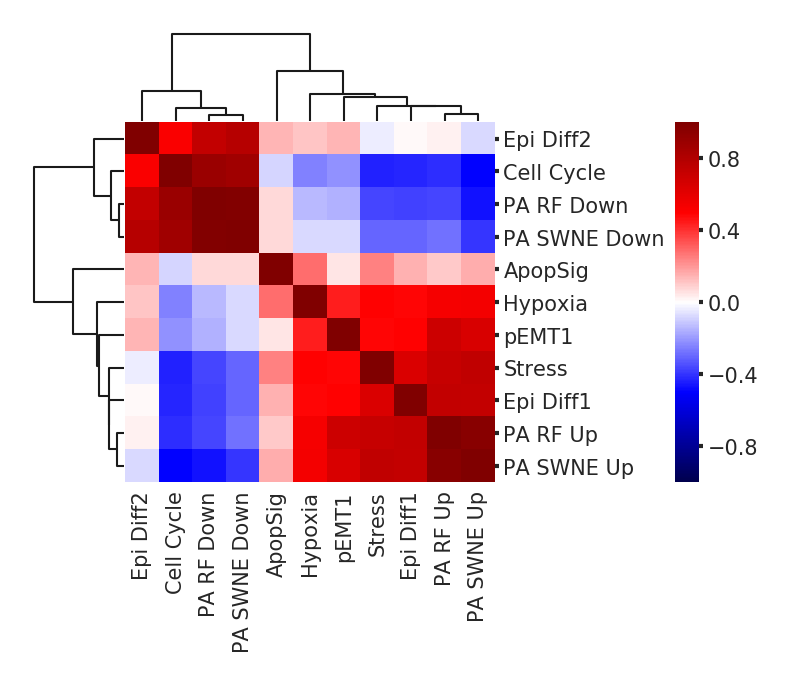

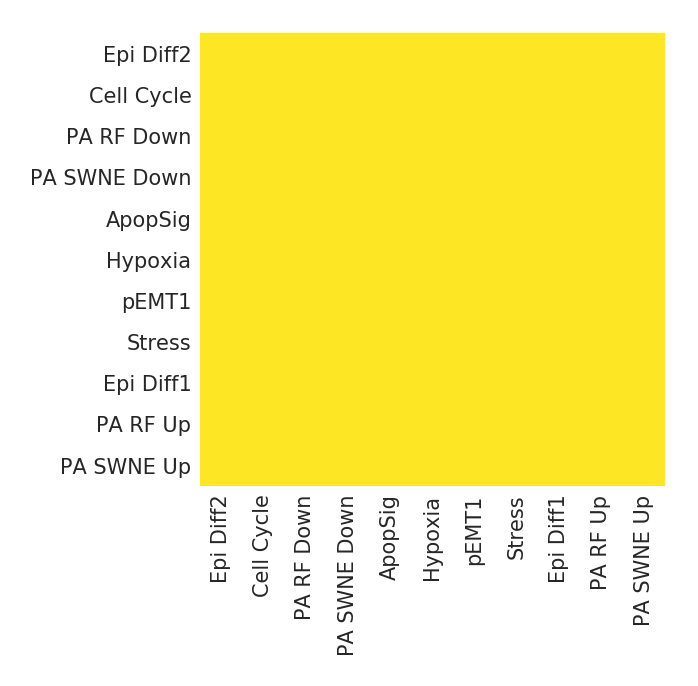

In [133]:
from scipy.stats import *    
X = gsva.values
Corr = np.empty((X.shape[0], X.shape[0]))
pCorr = np.empty((X.shape[0], X.shape[0])) 

for i in range(X.shape[0]):
    for j in range(X.shape[0]):
        x, y = X[i,:], X[j,:]
        stat, p = pearsonr(x, y)
        Corr[i,j], pCorr[i,j] = stat, p

from statsmodels.stats.multitest import multipletests
fdrCorr = np.reshape(multipletests(pCorr.flatten())[1], pCorr.shape) # FDR
CorrDf = pd.DataFrame(Corr, index=plot_keys, columns=plot_keys)    
fdrCorrDf = pd.DataFrame(fdrCorr, index=plot_keys, columns=plot_keys) 

mpl.rc('figure', dpi=300)
mpl.style.use('NaturePub')
g1 = sns.clustermap(CorrDf, figsize=(2,2), cmap='seismic', vmin=-1, vmax=1)
cbar = g1.cax
x0,y0,x1,y1 = np.array(g1.ax_heatmap.get_position()).flatten()
cbar.set_position([x1+0.3, y0, 0.04, y1-y0])
g1.savefig('../Figure/Fig3/SigCorrHeatmap_Adapt_%s_%s.png'%(sample, method), dpi=300)

xlabels = CorrDf.columns[np.array(g1.dendrogram_col.reordered_ind)]
fdrCorrDf = fdrCorrDf.loc[xlabels,xlabels]
fig = plt.figure(figsize=(2,2))
sns.heatmap(fdrCorrDf<0.05, vmin=0, vmax=1, cmap='viridis', cbar=False)
plt.savefig('../Figure/Fig3/SigFdrCorrHeatmap_Adapt_%s_%s.png'%(sample, method), dpi=300)

In [134]:
sample = 't47d' # here is preAdapt t47d
method = 'ssgsea' # gsva has not finished calculation

for n, keyword in enumerate(keywords):

    fpath = '../data/GSVA2/{}_{}.{}.csv'.format(sample, keyword, method)
    tmp = pd.read_csv(fpath, index_col=0)
    gsva = tmp if n==0 else pd.concat((gsva, tmp))
print(gsva.shape)

gsva.index = ['ApopSig' if x=='MCF7_EndSigUp' else x for x in gsva.index]
gsva.columns = [x.replace('.',':') for x in gsva.columns]
gsva.head(3)

(11, 15805)


,T47D:1,T47D:2,T47D:3,T47D:4,T47D:5,T47D:6,T47D:7,T47D:8,T47D:9,T47D:10,...,T47D:LTED:4263,T47D:LTED:4264,T47D:LTED:4265,T47D:LTED:4266,T47D:LTED:4267,T47D:LTED:4268,T47D:LTED:4269,T47D:LTED:4270,T47D:LTED:4271,T47D:LTED:4272
CellCycle,0.314648,0.450967,0.109353,0.340809,0.234778,0.055697,0.602759,0.007309,0.385111,0.037832,...,0.230455,0.189870,0.402147,0.008850,0.059617,0.383180,0.160059,0.455513,0.221399,0.057331
stress,0.274968,0.190070,0.298437,0.332184,0.390706,0.263698,0.449741,0.315228,0.308085,0.400166,...,0.350009,0.232426,0.369230,0.455128,0.441138,0.343894,0.405422,0.207959,0.422698,0.320739
PaRfUp,0.742601,0.884969,0.863508,0.827373,0.790704,0.711253,0.973919,0.782420,0.687546,0.717502,...,0.843748,0.774417,0.840422,0.690686,1.006915,0.985461,0.889087,0.963480,0.878846,0.861183


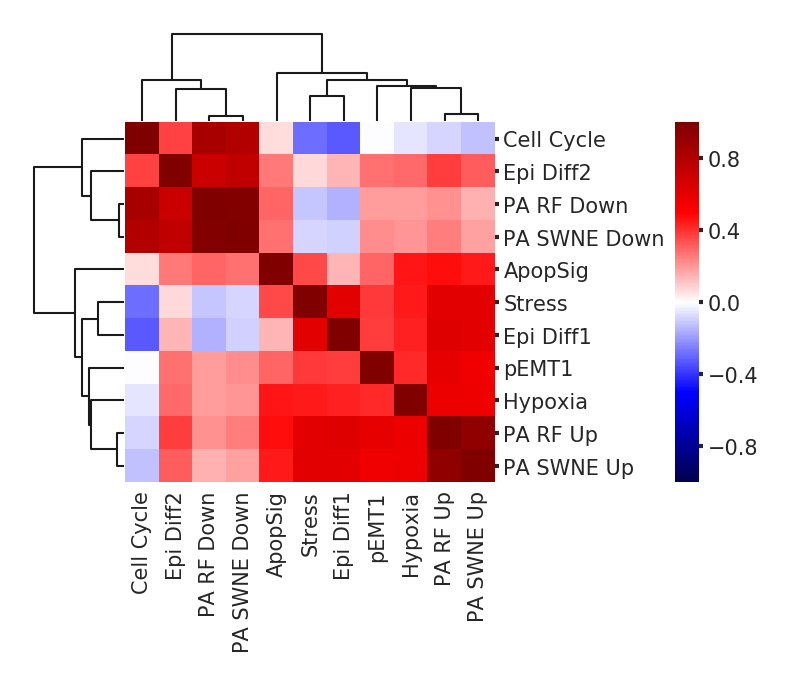

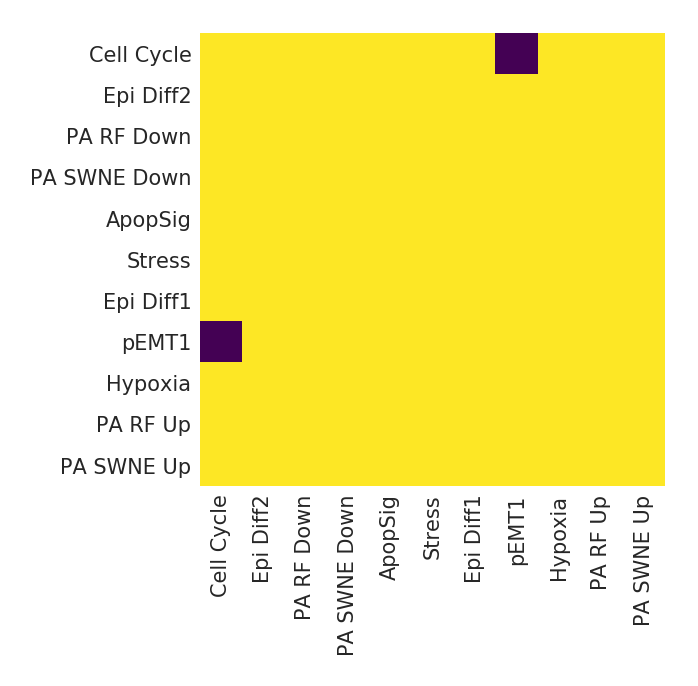

In [135]:
key_sel = ['ApopSig','CellCycle', 'stress', 'PaRfUp', 'EpiDiff1', 'PaSwneUp', 'hypoxia',
       'PaRfDown', 'PaSwneDown', 'pEMT1', 'EpiDiff2']
plot_keys = ['ApopSig','Cell Cycle', 'Stress', 'PA RF Up', 'Epi Diff1', 'PA SWNE Up', 'Hypoxia',
       'PA RF Down', 'PA SWNE Down', 'pEMT1', 'Epi Diff2']
sample = 't47d' # here is preAdapt MCF7
method = 'ssgsea' # gsva has not finished calculation


gsva = gsva.loc[key_sel,:]
gsva.index = plot_keys

from scipy.stats import *    
X = gsva.values
Corr = np.empty((X.shape[0], X.shape[0]))
pCorr = np.empty((X.shape[0], X.shape[0])) 

for i in range(X.shape[0]):
    for j in range(X.shape[0]):
        x, y = X[i,:], X[j,:]
        stat, p = pearsonr(x, y)
        Corr[i,j], pCorr[i,j] = stat, p

from statsmodels.stats.multitest import multipletests
fdrCorr = np.reshape(multipletests(pCorr.flatten())[1], pCorr.shape) # FDR
CorrDf = pd.DataFrame(Corr, index=plot_keys, columns=plot_keys)    
fdrCorrDf = pd.DataFrame(fdrCorr, index=plot_keys, columns=plot_keys) 

mpl.rc('figure', dpi=300)
mpl.style.use('NaturePub')
g1 = sns.clustermap(CorrDf, figsize=(2,2), cmap='seismic', vmin=-1, vmax=1)
cbar = g1.cax
x0,y0,x1,y1 = np.array(g1.ax_heatmap.get_position()).flatten()
cbar.set_position([x1+0.3, y0, 0.04, y1-y0])
g1.savefig('../Figure/Fig3/SigCorrHeatmap_Adapt_%s_%s.png'%(sample, method), dpi=300)

xlabels = CorrDf.columns[np.array(g1.dendrogram_col.reordered_ind)]
fdrCorrDf = fdrCorrDf.loc[xlabels,xlabels]
fig = plt.figure(figsize=(2,2))
sns.heatmap(fdrCorrDf<0.05, vmin=0, vmax=1, cmap='viridis', cbar=False)
plt.savefig('../Figure/Fig3/SigFdrCorrHeatmap_Adapt_%s_%s.png'%(sample, method), dpi=300)

## Temporal GSVA in preAdapt dataset

In [167]:
sample = 'MCF7' # here is preAdapt MCF7
method = 'ssgsea' # gsva has not finished calculation

for n, keyword in enumerate(keywords):

    fpath = '../data/GSVA2/{}_{}.{}.csv'.format(sample, keyword, method)
    tmp = pd.read_csv(fpath, index_col=0)
    gsva = tmp if n==0 else pd.concat((gsva, tmp))
print(gsva.shape)

gsva.index = ['ApopSig' if x=='MCF7_EndSigUp' else x for x in gsva.index]
gsva.columns = [x.replace('.',':') for x in gsva.columns]


key_sel = ['ApopSig','CellCycle', 'stress', 'PaRfUp', 'EpiDiff1', 'PaSwneUp', 'hypoxia',
       'PaRfDown', 'PaSwneDown', 'pEMT1', 'EpiDiff2']
plot_keys = ['ApopSig','Cell Cycle', 'Stress', 'PA RF Up', 'Epi Diff1', 'PA SWNE Up', 'Hypoxia',
       'PA RF Down', 'PA SWNE Down', 'pEMT1', 'Epi Diff2']
gsva = gsva.loc[key_sel,:]
gsva.index = plot_keys

(11, 31602)


In [180]:
Groups = np.array([x.split(':')[0] for x in gsva.columns])
GroupDict = dict(Counter([x.split(':')[0] for x in gsva.columns]))
GroupDict

{'MCF7_RM': 1215,
 'MCF7_RM_CD44L': 4998,
 'MCF7_RM_CD44H': 4981,
 'MCF7_WM2d_CD44L': 4977,
 'MCF7_WM2d_CD44H': 4999,
 'MCF7_WM4d_CD44L': 2013,
 'MCF7_WM4d_CD44H': 1649,
 'MCF7_WM7d_CD44L': 2697,
 'MCF7_WM7d_CD44H': 2129,
 'LTED': 1944}

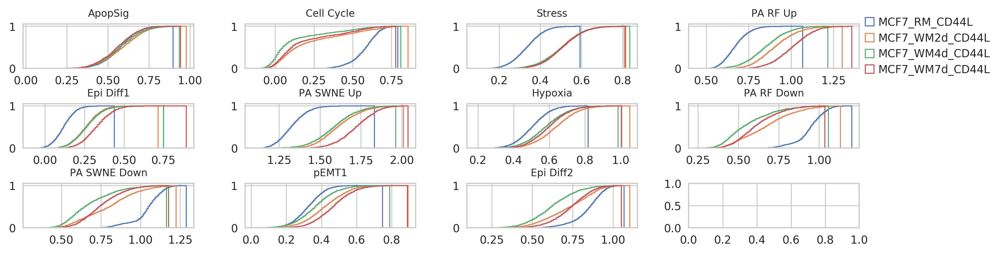

In [199]:
n_bins = 100

nplots = len(keywords)
ncols = 4
nrows = ceil(nplots/ncols)

fig, axes = plt.subplots(ncols=ncols, nrows=nrows, figsize=(ncols*3, nrows*1), dpi=300)
plt.subplots_adjust(wspace=0.3, hspace=0.8) # 
axes_list = axes.flatten()

for n, keyword in enumerate(plot_keys):
    ax = axes_list[n]
    for k in GroupDict.keys():
        if k.endswith('CD44L'):
            x = gsva.loc[keyword, :].values[Groups==k]
            ax.hist(x, bins=100, histtype='step', cumulative=True, density=True, label=k)
    
    ax.set_title(keyword, fontsize=8)
    if n == ncols-1:
        ax.legend(loc='center', bbox_to_anchor=(1.4,0.5))        

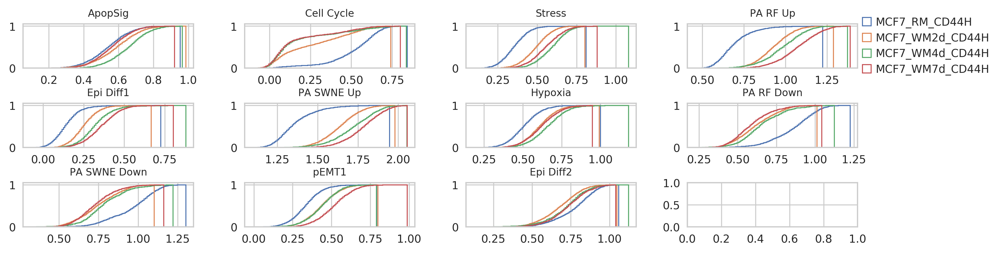

In [200]:
n_bins = 100

nplots = len(keywords)
ncols = 4
nrows = ceil(nplots/ncols)

fig, axes = plt.subplots(ncols=ncols, nrows=nrows, figsize=(ncols*3, nrows*1), dpi=300)
plt.subplots_adjust(wspace=0.3, hspace=0.8) # 
axes_list = axes.flatten()

for n, keyword in enumerate(plot_keys):
    ax = axes_list[n]
    for k in GroupDict.keys():
        if k.endswith('CD44H'):
            x = gsva.loc[keyword, :].values[Groups==k]
            ax.hist(x, bins=100, histtype='step', cumulative=True, density=True, label=k)
    
    ax.set_title(keyword, fontsize=8)
    if n == ncols-1:
        ax.legend(loc='center', bbox_to_anchor=(1.4,0.5))        

## GSVA scatter in preAdapt MCF7

In [46]:
sample = 'MCF7' # here is preAdapt MCF7
method = 'ssgsea' # gsva has not finished calculation
keywords = ['ApopSig','CellCycle', 'PaSwneUp','PaSwneDown']
plot_keys = ['ApopSig','Cell Cycle', 'PA SWNE Up', 'PA SWNE Down']

for n, keyword in enumerate(keywords):
    fpath = '../data/GSVA2/{}_{}.{}.csv'.format(sample, keyword, method)
    tmp = pd.read_csv(fpath, index_col=0)
    gsva = tmp if n==0 else pd.concat((gsva, tmp))
print(gsva.shape)

gsva.index = ['ApopSig' if x=='MCF7_EndSigUp' else x for x in gsva.index]
gsva.columns = [x.replace('.',':') for x in gsva.columns]
gsva.index = plot_keys

(4, 31602)


In [47]:
Groups = np.array([x.split(':')[0] for x in gsva.columns])
GroupDict = dict(Counter([x.split(':')[0] for x in gsva.columns]))
GroupDict

{'MCF7_RM': 1215,
 'MCF7_RM_CD44L': 4998,
 'MCF7_RM_CD44H': 4981,
 'MCF7_WM2d_CD44L': 4977,
 'MCF7_WM2d_CD44H': 4999,
 'MCF7_WM4d_CD44L': 2013,
 'MCF7_WM4d_CD44H': 1649,
 'MCF7_WM7d_CD44L': 2697,
 'MCF7_WM7d_CD44H': 2129,
 'LTED': 1944}

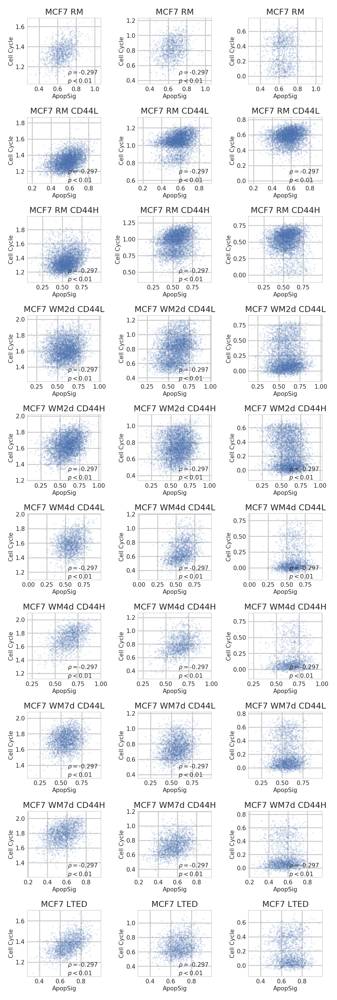

In [48]:
sns.set(context='paper', style='whitegrid', palette='deep', font='sans-serif', 
font_scale=1, color_codes=True)
mpl.style.use('NaturePub')

nplots = len(GroupDict)*3
ncols = 3
nrows = ceil(nplots/ncols)

fig, axes = plt.subplots(ncols=ncols, nrows=nrows, figsize=(ncols*1.5, nrows*1.5))
plt.subplots_adjust(wspace=.5, hspace=.5) # 
axes_list = axes.flatten()

from scipy.stats import *
n = -1
for group in GroupDict.keys():
    gsva_sel = gsva.loc[:,Groups==group]
    x = gsva_sel.loc['ApopSig',:].values 
    
    for yname in ['PA SWNE Up', 'PA SWNE Down', 'Cell Cycle']:
        n += 1 
        ax = axes_list[n]    

        y = gsva_sel.loc[yname,:].values 
        stat, p = pearsonr(x, y)
        ax.scatter(x,y,s=.1, alpha=.2)
        
        title = group.replace('_', ' ').replace('LTED', 'MCF7 LTED')
        ax.set_title(title, fontsize=7, pad=3)
        ax.set_xlabel('ApopSig', fontsize=5)
        ax.set_ylabel(term, fontsize=5)

        if p < 0.01:
            ax.text(0.55, 0.15, '${\\rho}=$%.3f'%rho, fontsize=5, transform = ax.transAxes)
            ax.text(0.55, 0.02, '${p}<0.01$', fontsize=5, transform = ax.transAxes) 

plt.savefig('../Figure/Fig3/SigCorrScatter_AdaptMCF7.svg')

## GSVA scatter in preAdapt T47D

In [49]:
sample = 't47d' # here is preAdapt T47D
method = 'ssgsea' # gsva has not finished calculation
keywords = ['ApopSig','CellCycle', 'PaSwneUp','PaSwneDown']
plot_keys = ['ApopSig','Cell Cycle', 'PA SWNE Up', 'PA SWNE Down']

for n, keyword in enumerate(keywords):
    fpath = '../data/GSVA2/{}_{}.{}.csv'.format(sample, keyword, method)
    tmp = pd.read_csv(fpath, index_col=0)
    gsva = tmp if n==0 else pd.concat((gsva, tmp))
print(gsva.shape)

gsva.index = ['ApopSig' if x=='MCF7_EndSigUp' else x for x in gsva.index]
gsva.columns = [x.replace('.',':') for x in gsva.columns]
gsva.index = plot_keys

(4, 15805)


In [62]:
Idx = np.array([x.split(':')[-2] for x in gsva.columns])
GroupDict = dict(Counter(Idx))
GroupDict

{'T47D': 4233, 'RM': 3280, 'WM': 4020, 'LTED': 4272}

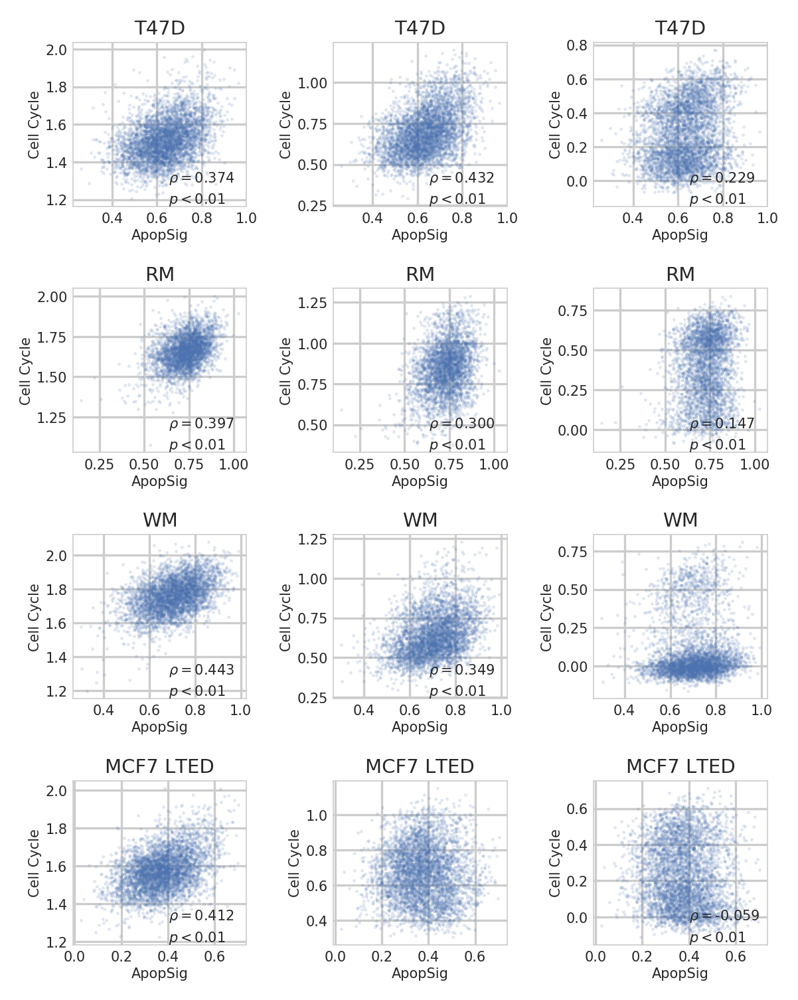

In [64]:
sns.set(context='paper', style='whitegrid', palette='deep', font='sans-serif', 
font_scale=1, color_codes=True)
mpl.style.use('NaturePub')

nplots = len(GroupDict)*3
ncols = 3
nrows = ceil(nplots/ncols)

fig, axes = plt.subplots(ncols=ncols, nrows=nrows, figsize=(ncols*1.5, nrows*1.5))
plt.subplots_adjust(wspace=.5, hspace=.5) # 
axes_list = axes.flatten()

from scipy.stats import *
n = -1
for group in GroupDict.keys():
    gsva_sel = gsva.loc[:,Idx==group]
    x = gsva_sel.loc['ApopSig',:].values 
    
    for yname in ['PA SWNE Up', 'PA SWNE Down', 'Cell Cycle']:
        n += 1 
        ax = axes_list[n]    

        y = gsva_sel.loc[yname,:].values 
        rho, p = pearsonr(x, y)
        ax.scatter(x,y,s=.1, alpha=.2)
        
        title = group.replace('_', ' ').replace('LTED', 'MCF7 LTED')
        ax.set_title(title, fontsize=7, pad=3)
        ax.set_xlabel('ApopSig', fontsize=5)
        ax.set_ylabel(term, fontsize=5)

        if p < 0.01:
            ax.text(0.55, 0.15, '${\\rho}=$%.3f'%rho, fontsize=5, transform = ax.transAxes)
            ax.text(0.55, 0.02, '${p}<0.01$', fontsize=5, transform = ax.transAxes) 

plt.savefig('../Figure/Fig3/SigCorrScatter_AdaptT47D.svg')